# Projet de prédiction du parti victorieux de chaque Comté des États-Unis d'Amérique aux élections de 2020

**Auteurs :** BANTO Jean Michel et ASSIENIN Kouassi Sylvain

**Institution :** Université Paris 1 Panthéon-Sorbonne

In [1]:
# Librairies
import numpy as np # import de la librairie numpy qui vous permettra d'effectuer plus simplement des calculs matriciel.
import pandas as pd # import de la librairie pandas pour la manipulation des tables de données
import matplotlib.pyplot as plt # import de la librairie matplotlib pour les graphiques

In [2]:
# Import de base de données
education = pd.read_excel('Education.xls')
population = pd.read_excel('PopulationEstimates.xls')
poverty = pd.read_excel('PovertyEstimates.xls')
results = pd.read_csv('2020_US_County_Level_Presidential_Results.csv')
compare = pd.read_csv('US_County_Level_Presidential_Results_08-16.csv')

In [3]:
education

,"Educational attainment for adults age 25 and older for the U.S., States, and counties, 1970-2019",Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
0,"Sources: U.S. Census Bureau, 1970, 1980, 1990,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FIPS Code,State,Area name,2003 Rural-urban Continuum Code,2003 Urban Influence Code,2013 Rural-urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970",...,Percent of adults completing some college or a...,Percent of adults with a bachelor's degree or ...,"Less than a high school diploma, 2015-19","High school diploma only, 2015-19","Some college or associate's degree, 2015-19","Bachelor's degree or higher, 2015-19",Percent of adults with less than a high school...,Percent of adults with a high school diploma o...,Percent of adults completing some college or a...,Percent of adults with a bachelor's degree or ...
4,00000,US,United States,NaN,NaN,NaN,NaN,52373312,34158051,11650730,...,27.4,24.4,26472261,59472748,63756905,70920162,11.998918,26.956844,28.898697,32.145542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [4]:
education.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3287 entries, 0 to 3286
Data columns (total 47 columns):
 #   Column                                                                                            Non-Null Count  Dtype 
---  ------                                                                                            --------------  ----- 
 0   Educational attainment for adults age 25 and older for the U.S., States, and counties, 1970-2019  3287 non-null   object
 1   Unnamed: 1                                                                                        3284 non-null   object
 2   Unnamed: 2                                                                                        3284 non-null   object
 3   Unnamed: 3                                                                                        3222 non-null   object
 4   Unnamed: 4                                                                                        3222 non-null   object
 5   Unname

In [5]:
edu = education.rename(columns = {'Educational attainment for adults age 25 and older for the U.S., States, and counties, 1970-2019': 'county_fips', 'Unnamed: 1':'edu1', 'Unnamed: 2':'edu2', 'Unnamed: 3':'edu3','Unnamed: 4':'edu4','Unnamed: 5':'edu5','Unnamed: 6':'edu6','Unnamed: 7':'edu7','Unnamed: 8':'edu8','Unnamed: 9':'edu9','Unnamed: 10':'edu10','Unnamed: 11':'edu11','Unnamed: 12':'edu12','Unnamed: 13':'edu13','Unnamed: 14':'edu14','Unnamed: 15':'edu15','Unnamed: 16':'edu16','Unnamed: 17':'edu17','Unnamed: 18':'edu18','Unnamed: 19':'edu19','Unnamed: 20':'edu20','Unnamed: 21':'edu21','Unnamed: 22':'edu22','Unnamed: 23':'edu23','Unnamed: 24':'edu24','Unnamed: 25':'edu25','Unnamed: 26':'edu26','Unnamed: 27':'edu27','Unnamed: 28':'edu28','Unnamed: 29':'edu29','Unnamed: 30':'edu30','Unnamed: 31':'edu31','Unnamed: 32':'edu32','Unnamed: 33':'edu33','Unnamed: 34':'edu34','Unnamed: 35':'edu35','Unnamed: 36':'edu36','Unnamed: 37':'edu37','Unnamed: 38':'edu38','Unnamed: 39':'edu39','Unnamed: 40':'edu40','Unnamed: 41':'edu41','Unnamed: 42':'edu42','Unnamed: 43':'edu43','Unnamed: 44':'edu44','Unnamed: 45':'edu45','Unnamed: 46':'edu46'})
edu

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
0,"Sources: U.S. Census Bureau, 1970, 1980, 1990,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FIPS Code,State,Area name,2003 Rural-urban Continuum Code,2003 Urban Influence Code,2013 Rural-urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970",...,Percent of adults completing some college or a...,Percent of adults with a bachelor's degree or ...,"Less than a high school diploma, 2015-19","High school diploma only, 2015-19","Some college or associate's degree, 2015-19","Bachelor's degree or higher, 2015-19",Percent of adults with less than a high school...,Percent of adults with a high school diploma o...,Percent of adults completing some college or a...,Percent of adults with a bachelor's degree or ...
4,00000,US,United States,NaN,NaN,NaN,NaN,52373312,34158051,11650730,...,27.4,24.4,26472261,59472748,63756905,70920162,11.998918,26.956844,28.898697,32.145542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [6]:
edu_update = edu.drop(3)
edu_update

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
0,"Sources: U.S. Census Bureau, 1970, 1980, 1990,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00000,US,United States,NaN,NaN,NaN,NaN,52373312,34158051,11650730,...,27.4,24.4,26472261,59472748,63756905,70920162,11.998918,26.956844,28.898697,32.145542
5,01000,AL,Alabama,NaN,NaN,NaN,NaN,1062306,468269,136287,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [7]:
edu_update = edu_update.drop(0)
edu_update

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00000,US,United States,NaN,NaN,NaN,NaN,52373312,34158051,11650730,...,27.4,24.4,26472261,59472748,63756905,70920162,11.998918,26.956844,28.898697,32.145542
5,01000,AL,Alabama,NaN,NaN,NaN,NaN,1062306,468269,136287,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
6,01001,AL,Autauga County,2,2,2,2,6611,3757,933,...,26.9,18,4291,12551,10596,9929,11.483395,33.588459,28.356571,26.571573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [8]:
edu_update = edu_update.drop(4)
edu_update

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,01000,AL,Alabama,NaN,NaN,NaN,NaN,1062306,468269,136287,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
6,01001,AL,Autauga County,2,2,2,2,6611,3757,933,...,26.9,18,4291,12551,10596,9929,11.483395,33.588459,28.356571,26.571573
7,01003,AL,Baldwin County,4,5,3,2,18726,8426,2334,...,29.3,23.1,13893,41797,47274,48148,9.193843,27.659616,31.284081,31.862459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [9]:
edu_update = edu_update.drop(1)
edu_update

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,01000,AL,Alabama,NaN,NaN,NaN,NaN,1062306,468269,136287,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
6,01001,AL,Autauga County,2,2,2,2,6611,3757,933,...,26.9,18,4291,12551,10596,9929,11.483395,33.588459,28.356571,26.571573
7,01003,AL,Baldwin County,4,5,3,2,18726,8426,2334,...,29.3,23.1,13893,41797,47274,48148,9.193843,27.659616,31.284081,31.862459
8,01005,AL,Barbour County,6,6,6,6,8120,2242,581,...,21.3,10.9,4812,6396,4676,2080,26.786907,35.604542,26.029837,11.578713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [10]:
edu_update = edu_update.drop(2)
edu_update

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
5,01000,AL,Alabama,NaN,NaN,NaN,NaN,1062306,468269,136287,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
6,01001,AL,Autauga County,2,2,2,2,6611,3757,933,...,26.9,18,4291,12551,10596,9929,11.483395,33.588459,28.356571,26.571573
7,01003,AL,Baldwin County,4,5,3,2,18726,8426,2334,...,29.3,23.1,13893,41797,47274,48148,9.193843,27.659616,31.284081,31.862459
8,01005,AL,Barbour County,6,6,6,6,8120,2242,581,...,21.3,10.9,4812,6396,4676,2080,26.786907,35.604542,26.029837,11.578713
9,01007,AL,Bibb County,1,1,1,1,5272,1402,238,...,20.4,7.1,3386,7256,3848,1678,20.942602,44.878773,23.800098,10.378526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [11]:
edu_update.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3282 entries, 5 to 3286
Data columns (total 47 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   county_fips  3282 non-null   object
 1   edu1         3282 non-null   object
 2   edu2         3282 non-null   object
 3   edu3         3221 non-null   object
 4   edu4         3221 non-null   object
 5   edu5         3221 non-null   object
 6   edu6         3221 non-null   object
 7   edu7         3185 non-null   object
 8   edu8         3185 non-null   object
 9   edu9         3185 non-null   object
 10  edu10        3185 non-null   object
 11  edu11        3185 non-null   object
 12  edu12        3185 non-null   object
 13  edu13        3185 non-null   object
 14  edu14        3185 non-null   object
 15  edu15        3266 non-null   object
 16  edu16        3266 non-null   object
 17  edu17        3266 non-null   object
 18  edu18        3266 non-null   object
 19  edu19        3266 non-null 

In [12]:
edu_update['county_fips']=edu_update['county_fips'].astype(int)
edu_update

,county_fips,edu1,edu2,edu3,edu4,edu5,edu6,edu7,edu8,edu9,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
5,1000,AL,Alabama,NaN,NaN,NaN,NaN,1062306,468269,136287,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
6,1001,AL,Autauga County,2,2,2,2,6611,3757,933,...,26.9,18,4291,12551,10596,9929,11.483395,33.588459,28.356571,26.571573
7,1003,AL,Baldwin County,4,5,3,2,18726,8426,2334,...,29.3,23.1,13893,41797,47274,48148,9.193843,27.659616,31.284081,31.862459
8,1005,AL,Barbour County,6,6,6,6,8120,2242,581,...,21.3,10.9,4812,6396,4676,2080,26.786907,35.604542,26.029837,11.578713
9,1007,AL,Bibb County,1,1,1,1,5272,1402,238,...,20.4,7.1,3386,7256,3848,1678,20.942602,44.878773,23.800098,10.378526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,PR,Vega Baja Municipio,1,1,1,1,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,PR,Vieques Municipio,7,12,7,12,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,PR,Villalba Municipio,2,2,2,2,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,PR,Yabucoa Municipio,1,1,1,1,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [13]:
df_edu = edu_update.drop(["edu1", "edu2"], axis=1)
df_edu

,county_fips,edu3,edu4,edu5,edu6,edu7,edu8,edu9,edu10,edu11,...,edu37,edu38,edu39,edu40,edu41,edu42,edu43,edu44,edu45,edu46
5,1000,NaN,NaN,NaN,NaN,1062306,468269,136287,141936,58.7,...,25.9,19,458922,1022839,993344,845772,13.819302,30.800268,29.912098,25.468332
6,1001,2,2,2,2,6611,3757,933,767,54.8,...,26.9,18,4291,12551,10596,9929,11.483395,33.588459,28.356571,26.571573
7,1003,4,5,3,2,18726,8426,2334,2038,59.4,...,29.3,23.1,13893,41797,47274,48148,9.193843,27.659616,31.284081,31.862459
8,1005,6,6,6,6,8120,2242,581,861,68.8,...,21.3,10.9,4812,6396,4676,2080,26.786907,35.604542,26.029837,11.578713
9,1007,1,1,1,1,5272,1402,238,302,73.1,...,20.4,7.1,3386,7256,3848,1678,20.942602,44.878773,23.800098,10.378526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3282,72145,1,1,1,1,NaN,NaN,NaN,NaN,NaN,...,21.4,14.4,10494,9681,8905,7834,28.428238,26.225822,24.123638,21.2223
3283,72147,7,12,7,12,NaN,NaN,NaN,NaN,NaN,...,13.7,10.1,1792,2440,875,1121,28.773281,39.177906,14.049454,17.999357
3284,72149,2,2,2,2,NaN,NaN,NaN,NaN,NaN,...,18,12.8,3330,5809,2987,3015,21.993263,38.366028,19.727892,19.912819
3285,72151,1,1,1,1,NaN,NaN,NaN,NaN,NaN,...,18.3,12.1,6927,6132,6494,4293,29.048897,25.715004,27.233078,18.003019


In [14]:
population

,"Population estimates for the U.S., States, and counties, 2010-19 (see the second tab in this workbook for variable name descriptions)",Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 155,Unnamed: 156,Unnamed: 157,Unnamed: 158,Unnamed: 159,Unnamed: 160,Unnamed: 161,Unnamed: 162,Unnamed: 163,Unnamed: 164
0,These data were posted to the ERS website (at ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FIPStxt,State,Area_Name,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003,Urban_Influence_Code_2013,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,...,R_DOMESTIC_MIG_2019,R_NET_MIG_2011,R_NET_MIG_2012,R_NET_MIG_2013,R_NET_MIG_2014,R_NET_MIG_2015,R_NET_MIG_2016,R_NET_MIG_2017,R_NET_MIG_2018,R_NET_MIG_2019
2,00000,US,United States,NaN,NaN,NaN,NaN,NaN,308745538,308758105,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01000,AL,Alabama,NaN,NaN,NaN,NaN,NaN,4779736,4780125,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,01001,AL,Autauga County,2,2,2,2,0,54571,54597,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,PR,"Vega Baja Municipio, Puerto Rico",1,1,1,1,NaN,59662,59662,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,PR,"Vieques Municipio, Puerto Rico",7,7,12,12,NaN,9301,9301,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,PR,"Villalba Municipio, Puerto Rico",2,2,2,2,NaN,26073,26073,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,PR,"Yabucoa Municipio, Puerto Rico",1,1,1,1,NaN,37941,37941,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
popu = population.drop(["Unnamed: 1", "Unnamed: 2"], axis=1)
popu

,"Population estimates for the U.S., States, and counties, 2010-19 (see the second tab in this workbook for variable name descriptions)",Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,...,Unnamed: 155,Unnamed: 156,Unnamed: 157,Unnamed: 158,Unnamed: 159,Unnamed: 160,Unnamed: 161,Unnamed: 162,Unnamed: 163,Unnamed: 164
0,These data were posted to the ERS website (at ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FIPStxt,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003,Urban_Influence_Code_2013,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,POP_ESTIMATE_2010,POP_ESTIMATE_2011,...,R_DOMESTIC_MIG_2019,R_NET_MIG_2011,R_NET_MIG_2012,R_NET_MIG_2013,R_NET_MIG_2014,R_NET_MIG_2015,R_NET_MIG_2016,R_NET_MIG_2017,R_NET_MIG_2018,R_NET_MIG_2019
2,00000,NaN,NaN,NaN,NaN,NaN,308745538,308758105,309321666,311556874,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01000,NaN,NaN,NaN,NaN,NaN,4779736,4780125,4785437,4799069,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,01001,2,2,2,2,0,54571,54597,54773,55227,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,1,1,1,1,NaN,59662,59662,59562,58688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,7,7,12,12,NaN,9301,9301,9314,9247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,2,2,2,2,NaN,26073,26073,26001,25542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,1,1,1,1,NaN,37941,37941,37874,37361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
popu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3275 entries, 0 to 3274
Columns: 163 entries, Population estimates for the U.S., States, and counties, 2010-19 (see the second tab in this workbook for variable name descriptions) to Unnamed: 164
dtypes: object(163)
memory usage: 4.1+ MB


In [17]:
popu.isna().sum()

Population estimates for the U.S., States, and counties, 2010-19 (see the second tab in this workbook for variable name descriptions)     0
Unnamed: 3                                                                                                                               59
Unnamed: 4                                                                                                                               54
Unnamed: 5                                                                                                                               59
Unnamed: 6                                                                                                                               54
                                                                                                                                         ..
Unnamed: 160                                                                                                                             81
Unnamed: 161        

In [18]:
pop = popu.rename(columns = {'Population estimates for the U.S., States, and counties, 2010-19 (see the second tab in this workbook for variable name descriptions)': 'county_fips', 'Unnamed: 3':'pop3','Unnamed: 4':'pop4','Unnamed: 5':'pop5','Unnamed: 6':'pop6','Unnamed: 7':'pop7','Unnamed: 8':'pop8','Unnamed: 9':'pop9','Unnamed: 10':'pop10','Unnamed: 11':'pop11','Unnamed: 12':'pop12','Unnamed: 13':'pop13','Unnamed: 14':'pop14','Unnamed: 15':'pop15','Unnamed: 16':'pop16','Unnamed: 17':'pop17','Unnamed: 18':'pop18','Unnamed: 19':'pop19','Unnamed: 20':'pop20','Unnamed: 21':'pop21','Unnamed: 22':'pop22','Unnamed: 23':'pop23','Unnamed: 24':'pop24','Unnamed: 25':'pop25','Unnamed: 26':'pop26','Unnamed: 27':'pop27','Unnamed: 28':'pop28','Unnamed: 29':'pop29','Unnamed: 30':'pop30','Unnamed: 31':'pop31','Unnamed: 32':'pop32','Unnamed: 33':'pop33','Unnamed: 34':'pop34','Unnamed: 35':'pop35','Unnamed: 36':'pop36','Unnamed: 37':'pop37','Unnamed: 38':'pop38','Unnamed: 39':'pop39','Unnamed: 40':'pop40','Unnamed: 41':'pop41','Unnamed: 42':'pop42','Unnamed: 43':'pop43','Unnamed: 44':'pop44','Unnamed: 45':'pop45','Unnamed: 46':'pop46','Unnamed: 47':'pop47','Unnamed: 48':'pop48','Unnamed: 49':'pop49','Unnamed: 50':'pop50','Unnamed: 51':'pop51','Unnamed: 52':'pop52','Unnamed: 53':'pop53','Unnamed: 54':'pop54','Unnamed: 55':'pop55','Unnamed: 56':'pop56','Unnamed: 57':'pop57','Unnamed: 58':'pop58','Unnamed: 59':'pop59','Unnamed: 60':'pop60','Unnamed: 61':'pop61','Unnamed: 62':'pop62','Unnamed: 63':'pop63','Unnamed: 64':'pop64','Unnamed: 65':'pop65','Unnamed: 66':'pop66','Unnamed: 67':'pop68','Unnamed: 69':'pop69','Unnamed: 70':'pop70','Unnamed: 71':'pop71','Unnamed: 72':'pop72','Unnamed: 73':'pop74','Unnamed: 75':'pop75','Unnamed: 76':'pop76','Unnamed: 77':'pop77','Unnamed: 78':'pop78','Unnamed: 79':'pop79','Unnamed: 80':'pop80','Unnamed: 81':'pop81','Unnamed: 82':'pop82','Unnamed: 83':'pop83','Unnamed: 84':'pop84','Unnamed: 85':'pop85','Unnamed: 86':'pop86','Unnamed: 87':'pop87','Unnamed: 88':'pop88','Unnamed: 89':'pop89','Unnamed: 90':'pop90','Unnamed: 91':'pop91','Unnamed: 92':'pop92','Unnamed: 93':'pop93','Unnamed: 94':'pop94','Unnamed: 95':'pop95','Unnamed: 96':'pop96','Unnamed: 97':'pop97','Unnamed: 98':'pop98','Unnamed: 99':'pop99','Unnamed: 100':'pop100','Unnamed: 101':'pop101','Unnamed: 102':'pop102','Unnamed: 103':'pop103', 'Unnamed: 104':'pop104','Unnamed: 105':'pop105', 'Unnamed: 106':'pop106', 'Unnamed: 107':'pop107','Unnamed: 108':'pop108', 'Unnamed: 109':'pop109','Unnamed: 110':'pop110','Unnamed: 111':'pop111','Unnamed: 112':'pop112','Unnamed: 113':'pop113','Unnamed: 114':'pop114','Unnamed: 115':'pop115','Unnamed: 116':'pop116','Unnamed: 117':'pop117','Unnamed: 118':'pop118','Unnamed: 119':'pop119','Unnamed: 120':'pop120','Unnamed: 121':'pop121','Unnamed: 122':'pop122','Unnamed: 123':'pop123','Unnamed: 124':'pop124','Unnamed: 125':'pop125','Unnamed: 126':'pop126','Unnamed: 127':'pop127','Unnamed: 128':'pop128','Unnamed: 129':'pop129','Unnamed: 130':'pop130','Unnamed: 131':'pop131','Unnamed: 132':'pop132','Unnamed: 133':'pop133','Unnamed: 134':'pop134','Unnamed: 135':'pop135','Unnamed: 136':'pop136','Unnamed: 137':'pop137','Unnamed: 138':'pop138','Unnamed: 139':'pop139','Unnamed: 140':'pop140','Unnamed: 141':'pop141','Unnamed: 142':'pop142','Unnamed: 143':'pop143','Unnamed: 144':'pop144','Unnamed: 145':'pop145','Unnamed: 146':'pop146','Unnamed: 147':'pop147','Unnamed: 148':'pop148','Unnamed: 149':'pop149','Unnamed: 150':'pop150','Unnamed: 151':'pop151','Unnamed: 152':'pop152','Unnamed: 153':'pop153','Unnamed: 154':'pop154','Unnamed: 155':'pop155','Unnamed: 156':'pop156','Unnamed: 157':'pop157','Unnamed: 158':'pop158','Unnamed: 159':'pop159','Unnamed: 160':'pop160','Unnamed: 161':'pop161','Unnamed: 162':'pop162','Unnamed: 163':'pop163','Unnamed: 164':'pop164'})
pop

,county_fips,pop3,pop4,pop5,pop6,pop7,pop8,pop9,pop10,pop11,...,pop155,pop156,pop157,pop158,pop159,pop160,pop161,pop162,pop163,pop164
0,These data were posted to the ERS website (at ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FIPStxt,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003,Urban_Influence_Code_2013,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,POP_ESTIMATE_2010,POP_ESTIMATE_2011,...,R_DOMESTIC_MIG_2019,R_NET_MIG_2011,R_NET_MIG_2012,R_NET_MIG_2013,R_NET_MIG_2014,R_NET_MIG_2015,R_NET_MIG_2016,R_NET_MIG_2017,R_NET_MIG_2018,R_NET_MIG_2019
2,00000,NaN,NaN,NaN,NaN,NaN,308745538,308758105,309321666,311556874,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01000,NaN,NaN,NaN,NaN,NaN,4779736,4780125,4785437,4799069,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,01001,2,2,2,2,0,54571,54597,54773,55227,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,1,1,1,1,NaN,59662,59662,59562,58688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,7,7,12,12,NaN,9301,9301,9314,9247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,2,2,2,2,NaN,26073,26073,26001,25542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,1,1,1,1,NaN,37941,37941,37874,37361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
pop_update = pop.drop(2)
pop_update

,county_fips,pop3,pop4,pop5,pop6,pop7,pop8,pop9,pop10,pop11,...,pop155,pop156,pop157,pop158,pop159,pop160,pop161,pop162,pop163,pop164
0,These data were posted to the ERS website (at ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FIPStxt,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003,Urban_Influence_Code_2013,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,POP_ESTIMATE_2010,POP_ESTIMATE_2011,...,R_DOMESTIC_MIG_2019,R_NET_MIG_2011,R_NET_MIG_2012,R_NET_MIG_2013,R_NET_MIG_2014,R_NET_MIG_2015,R_NET_MIG_2016,R_NET_MIG_2017,R_NET_MIG_2018,R_NET_MIG_2019
3,01000,NaN,NaN,NaN,NaN,NaN,4779736,4780125,4785437,4799069,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,01001,2,2,2,2,0,54571,54597,54773,55227,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
5,01003,4,3,5,2,5,182265,182265,183112,186558,...,24.017829,16.64187,17.488579,22.751474,20.184334,17.725964,21.279291,22.398256,24.727215,24.380567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,1,1,1,1,NaN,59662,59662,59562,58688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,7,7,12,12,NaN,9301,9301,9314,9247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,2,2,2,2,NaN,26073,26073,26001,25542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,1,1,1,1,NaN,37941,37941,37874,37361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
pop_update = pop_update.drop(0)
pop_update

,county_fips,pop3,pop4,pop5,pop6,pop7,pop8,pop9,pop10,pop11,...,pop155,pop156,pop157,pop158,pop159,pop160,pop161,pop162,pop163,pop164
1,FIPStxt,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003,Urban_Influence_Code_2013,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,POP_ESTIMATE_2010,POP_ESTIMATE_2011,...,R_DOMESTIC_MIG_2019,R_NET_MIG_2011,R_NET_MIG_2012,R_NET_MIG_2013,R_NET_MIG_2014,R_NET_MIG_2015,R_NET_MIG_2016,R_NET_MIG_2017,R_NET_MIG_2018,R_NET_MIG_2019
3,01000,NaN,NaN,NaN,NaN,NaN,4779736,4780125,4785437,4799069,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,01001,2,2,2,2,0,54571,54597,54773,55227,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
5,01003,4,3,5,2,5,182265,182265,183112,186558,...,24.017829,16.64187,17.488579,22.751474,20.184334,17.725964,21.279291,22.398256,24.727215,24.380567
6,01005,6,6,6,6,3,27457,27455,27327,27341,...,-5.690302,0.292676,-6.897817,-8.132185,-5.140431,-15.724575,-18.238016,-24.998528,-8.754922,-5.165664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,1,1,1,1,NaN,59662,59662,59562,58688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,7,7,12,12,NaN,9301,9301,9314,9247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,2,2,2,2,NaN,26073,26073,26001,25542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,1,1,1,1,NaN,37941,37941,37874,37361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
pop_update = pop_update.drop(1)
pop_update

,county_fips,pop3,pop4,pop5,pop6,pop7,pop8,pop9,pop10,pop11,...,pop155,pop156,pop157,pop158,pop159,pop160,pop161,pop162,pop163,pop164
3,01000,NaN,NaN,NaN,NaN,NaN,4779736,4780125,4785437,4799069,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,01001,2,2,2,2,0,54571,54597,54773,55227,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
5,01003,4,3,5,2,5,182265,182265,183112,186558,...,24.017829,16.64187,17.488579,22.751474,20.184334,17.725964,21.279291,22.398256,24.727215,24.380567
6,01005,6,6,6,6,3,27457,27455,27327,27341,...,-5.690302,0.292676,-6.897817,-8.132185,-5.140431,-15.724575,-18.238016,-24.998528,-8.754922,-5.165664
7,01007,1,1,1,1,0,22915,22915,22870,22745,...,1.385134,-4.998356,-3.787545,-5.797999,1.331144,1.329817,-0.708717,-3.234669,-6.857092,1.831952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,1,1,1,1,NaN,59662,59662,59562,58688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,7,7,12,12,NaN,9301,9301,9314,9247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,2,2,2,2,NaN,26073,26073,26001,25542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,1,1,1,1,NaN,37941,37941,37874,37361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
pop_update['county_fips']=pop_update['county_fips'].astype(int)
pop_update

,county_fips,pop3,pop4,pop5,pop6,pop7,pop8,pop9,pop10,pop11,...,pop155,pop156,pop157,pop158,pop159,pop160,pop161,pop162,pop163,pop164
3,1000,NaN,NaN,NaN,NaN,NaN,4779736,4780125,4785437,4799069,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
4,1001,2,2,2,2,0,54571,54597,54773,55227,...,4.84731,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
5,1003,4,3,5,2,5,182265,182265,183112,186558,...,24.017829,16.64187,17.488579,22.751474,20.184334,17.725964,21.279291,22.398256,24.727215,24.380567
6,1005,6,6,6,6,3,27457,27455,27327,27341,...,-5.690302,0.292676,-6.897817,-8.132185,-5.140431,-15.724575,-18.238016,-24.998528,-8.754922,-5.165664
7,1007,1,1,1,1,0,22915,22915,22870,22745,...,1.385134,-4.998356,-3.787545,-5.797999,1.331144,1.329817,-0.708717,-3.234669,-6.857092,1.831952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,72145,1,1,1,1,NaN,59662,59662,59562,58688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3271,72147,7,7,12,12,NaN,9301,9301,9314,9247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3272,72149,2,2,2,2,NaN,26073,26073,26001,25542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3273,72151,1,1,1,1,NaN,37941,37941,37874,37361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
pop_update.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3272 entries, 3 to 3274
Columns: 163 entries, county_fips to pop164
dtypes: int32(1), object(162)
memory usage: 4.1+ MB


In [24]:
pop_update.isna().sum()

county_fips     0
pop3           57
pop4           52
pop5           57
pop6           52
               ..
pop160         79
pop161         79
pop162         79
pop163         79
pop164         79
Length: 163, dtype: int64

In [25]:
pop_update.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
county_fips,3272.0,NaN,NaN,NaN,31368.09566,16298.458338,1000.0,19026.5,30022.0,46101.25,72153.0
pop3,3215.0,9.0,6.0,613.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pop4,3220.0,9.0,6.0,597.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pop5,3215.0,12.0,2.0,702.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pop6,3220.0,12.0,2.0,763.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
pop160,3193.0,3181.0,0.0,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pop161,3193.0,3181.0,0.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pop162,3193.0,3188.0,0.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pop163,3193.0,3181.0,0.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
poverty

,"Poverty estimates for the U.S., States, and counties, 2019",Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33
0,"Source: U.S. Department of Commerce, Bureau of...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FIPStxt,Stabr,Area_name,Rural-urban_Continuum_Code_2003,Urban_Influence_Code_2003,Rural-urban_Continuum_Code_2013,Urban_Influence_Code_2013,POVALL_2019,CI90LBALL_2019,CI90UBALL_2019,...,CI90UB517P_2019,MEDHHINC_2019,CI90LBINC_2019,CI90UBINC_2019,POV04_2019,CI90LB04_2019,CI90UB04_2019,PCTPOV04_2019,CI90LB04P_2019,CI90UB04P_2019
4,00000,US,United States,NaN,NaN,NaN,NaN,39490096,39248096,39732096,...,16,65712,65594,65830,3457689,3405854,3509524,18.2,17.9,18.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,WY,Sweetwater County,5,8,5,8,3453,2743,4163,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,WY,Teton County,7,8,7,8,1396,1073,1719,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,WY,Uinta County,7,8,7,8,1699,1264,2134,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,WY,Washakie County,7,11,7,11,845,626,1064,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
povert = poverty.drop(["Unnamed: 1", "Unnamed: 2"], axis=1)
povert

,"Poverty estimates for the U.S., States, and counties, 2019",Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,...,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33
0,"Source: U.S. Department of Commerce, Bureau of...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FIPStxt,Rural-urban_Continuum_Code_2003,Urban_Influence_Code_2003,Rural-urban_Continuum_Code_2013,Urban_Influence_Code_2013,POVALL_2019,CI90LBALL_2019,CI90UBALL_2019,PCTPOVALL_2019,CI90LBALLP_2019,...,CI90UB517P_2019,MEDHHINC_2019,CI90LBINC_2019,CI90UBINC_2019,POV04_2019,CI90LB04_2019,CI90UB04_2019,PCTPOV04_2019,CI90LB04P_2019,CI90UB04P_2019
4,00000,NaN,NaN,NaN,NaN,39490096,39248096,39732096,12.3,12.2,...,16,65712,65594,65830,3457689,3405854,3509524,18.2,17.9,18.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
pov = povert.rename(columns = {'Poverty estimates for the U.S., States, and counties, 2019': 'county_fips', 'Unnamed: 3':'pov3','Unnamed: 4':'pov4','Unnamed: 5':'pov5','Unnamed: 6':'pov6','Unnamed: 7':'pov7','Unnamed: 8':'pov8','Unnamed: 9':'pov9','Unnamed: 10':'pov10','Unnamed: 11':'pov11','Unnamed: 12':'pov12','Unnamed: 13':'pov13','Unnamed: 14':'pov14','Unnamed: 15':'pov15','Unnamed: 16':'pov16','Unnamed: 17':'pov17','Unnamed: 18':'pov18','Unnamed: 19':'pov19','Unnamed: 20':'pov20','Unnamed: 21':'pov21','Unnamed: 22':'pov22','Unnamed: 23':'pov23','Unnamed: 24':'pov24','Unnamed: 25':'pov25','Unnamed: 26':'pov26','Unnamed: 27':'pov27','Unnamed: 28':'pov28','Unnamed: 29':'pov29','Unnamed: 30':'pov30','Unnamed: 31':'pov31','Unnamed: 32':'pov32','Unnamed: 33':'pov33'})
pov

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
0,"Source: U.S. Department of Commerce, Bureau of...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FIPStxt,Rural-urban_Continuum_Code_2003,Urban_Influence_Code_2003,Rural-urban_Continuum_Code_2013,Urban_Influence_Code_2013,POVALL_2019,CI90LBALL_2019,CI90UBALL_2019,PCTPOVALL_2019,CI90LBALLP_2019,...,CI90UB517P_2019,MEDHHINC_2019,CI90LBINC_2019,CI90UBINC_2019,POV04_2019,CI90LB04_2019,CI90UB04_2019,PCTPOV04_2019,CI90LB04P_2019,CI90UB04P_2019
4,00000,NaN,NaN,NaN,NaN,39490096,39248096,39732096,12.3,12.2,...,16,65712,65594,65830,3457689,3405854,3509524,18.2,17.9,18.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
pov_update = pov.drop(3)
pov_update

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
0,"Source: U.S. Department of Commerce, Bureau of...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00000,NaN,NaN,NaN,NaN,39490096,39248096,39732096,12.3,12.2,...,16,65712,65594,65830,3457689,3405854,3509524,18.2,17.9,18.5
5,01000,NaN,NaN,NaN,NaN,747478,730491,764465,15.6,15.2,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
pov_update = pov_update.drop(4)
pov_update

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
0,"Source: U.S. Department of Commerce, Bureau of...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,01000,NaN,NaN,NaN,NaN,747478,730491,764465,15.6,15.2,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
6,01001,2,2,2,2,6723,5517,7929,12.1,9.9,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
pov_update = pov_update.drop(0)
pov_update

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
1,"For definitions of rural classifications, see ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,01000,NaN,NaN,NaN,NaN,747478,730491,764465,15.6,15.2,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
6,01001,2,2,2,2,6723,5517,7929,12.1,9.9,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
7,01003,4,5,3,2,22360,18541,26179,10.1,8.4,...,17.2,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
pov_update = pov_update.drop(1)
pov_update

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
2,"This table was prepared by USDA, Economic Rese...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,01000,NaN,NaN,NaN,NaN,747478,730491,764465,15.6,15.2,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
6,01001,2,2,2,2,6723,5517,7929,12.1,9.9,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
7,01003,4,5,3,2,22360,18541,26179,10.1,8.4,...,17.2,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN
8,01005,6,6,6,6,5909,4787,7031,27.1,22,...,49,35972,31822,40122,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
pov_update = pov_update.drop(2)
pov_update

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
5,01000,NaN,NaN,NaN,NaN,747478,730491,764465,15.6,15.2,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
6,01001,2,2,2,2,6723,5517,7929,12.1,9.9,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
7,01003,4,5,3,2,22360,18541,26179,10.1,8.4,...,17.2,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN
8,01005,6,6,6,6,5909,4787,7031,27.1,22,...,49,35972,31822,40122,NaN,NaN,NaN,NaN,NaN,NaN
9,01007,1,1,1,1,4101,3225,4977,20.3,16,...,32.7,47918,42291,53545,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
pov_update.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3192 entries, 5 to 3196
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   county_fips  3192 non-null   object
 1   pov3         3136 non-null   object
 2   pov4         3136 non-null   object
 3   pov5         3141 non-null   object
 4   pov6         3141 non-null   object
 5   pov7         3192 non-null   object
 6   pov8         3192 non-null   object
 7   pov9         3192 non-null   object
 8   pov10        3192 non-null   object
 9   pov11        3192 non-null   object
 10  pov12        3192 non-null   object
 11  pov13        3192 non-null   object
 12  pov14        3192 non-null   object
 13  pov15        3192 non-null   object
 14  pov16        3192 non-null   object
 15  pov17        3192 non-null   object
 16  pov18        3192 non-null   object
 17  pov19        3192 non-null   object
 18  pov20        3192 non-null   object
 19  pov21        3192 non-null 

In [35]:
pov_update['county_fips']=pov_update['county_fips'].astype(int)
pov_update

,county_fips,pov3,pov4,pov5,pov6,pov7,pov8,pov9,pov10,pov11,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
5,1000,NaN,NaN,NaN,NaN,747478,730491,764465,15.6,15.2,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
6,1001,2,2,2,2,6723,5517,7929,12.1,9.9,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
7,1003,4,5,3,2,22360,18541,26179,10.1,8.4,...,17.2,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN
8,1005,6,6,6,6,5909,4787,7031,27.1,22,...,49,35972,31822,40122,NaN,NaN,NaN,NaN,NaN,NaN
9,1007,1,1,1,1,4101,3225,4977,20.3,16,...,32.7,47918,42291,53545,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,56037,5,8,5,8,3453,2743,4163,8.3,6.6,...,11.1,80639,73437,87841,NaN,NaN,NaN,NaN,NaN,NaN
3193,56039,7,8,7,8,1396,1073,1719,6,4.6,...,6.7,98837,86531,111143,NaN,NaN,NaN,NaN,NaN,NaN
3194,56041,7,8,7,8,1699,1264,2134,8.5,6.3,...,11.1,70756,63191,78321,NaN,NaN,NaN,NaN,NaN,NaN
3195,56043,7,11,7,11,845,626,1064,11.1,8.2,...,17.4,55122,50050,60194,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
pov_update.nunique()

county_fips    3192
pov3              9
pov4             12
pov5              9
pov6             12
pov7           2808
pov8           2706
pov9           2877
pov10           303
pov11           254
pov12           352
pov13          2224
pov14          1986
pov15          2380
pov16           409
pov17           324
pov18           502
pov19          1972
pov20          1736
pov21          2175
pov22           396
pov23           300
pov24           501
pov25          3076
pov26          3082
pov27          3078
pov28            51
pov29            51
pov30            51
pov31            44
pov32            44
pov33            48
dtype: int64

In [37]:
results

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff
0,Alabama,1001,Autauga County,19838,7503,27770,12335,0.714368,0.270184,0.444184
1,Alabama,1003,Baldwin County,83544,24578,109679,58966,0.761714,0.224090,0.537623
2,Alabama,1005,Barbour County,5622,4816,10518,806,0.534512,0.457882,0.076631
3,Alabama,1007,Bibb County,7525,1986,9595,5539,0.784263,0.206983,0.577280
4,Alabama,1009,Blount County,24711,2640,27588,22071,0.895716,0.095694,0.800022
...,...,...,...,...,...,...,...,...,...,...
3147,Wyoming,56037,Sweetwater County,12229,3823,16603,8406,0.736554,0.230260,0.506294
3148,Wyoming,56039,Teton County,4341,9848,14677,-5507,0.295769,0.670982,-0.375213
3149,Wyoming,56041,Uinta County,7496,1591,9402,5905,0.797277,0.169219,0.628058
3150,Wyoming,56043,Washakie County,3245,651,4012,2594,0.808824,0.162263,0.646560


In [38]:
results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3152 entries, 0 to 3151
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state_name      3152 non-null   object 
 1   county_fips     3152 non-null   int64  
 2   county_name     3152 non-null   object 
 3   votes_gop       3152 non-null   int64  
 4   votes_dem       3152 non-null   int64  
 5   total_votes     3152 non-null   int64  
 6   diff            3152 non-null   int64  
 7   per_gop         3152 non-null   float64
 8   per_dem         3152 non-null   float64
 9   per_point_diff  3152 non-null   float64
dtypes: float64(3), int64(5), object(2)
memory usage: 246.4+ KB


In [39]:
results['victory'] = np.where(results['per_gop'] >=0.5, 'republican_party','democratic_party')
results

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff,victory
0,Alabama,1001,Autauga County,19838,7503,27770,12335,0.714368,0.270184,0.444184,republican_party
1,Alabama,1003,Baldwin County,83544,24578,109679,58966,0.761714,0.224090,0.537623,republican_party
2,Alabama,1005,Barbour County,5622,4816,10518,806,0.534512,0.457882,0.076631,republican_party
3,Alabama,1007,Bibb County,7525,1986,9595,5539,0.784263,0.206983,0.577280,republican_party
4,Alabama,1009,Blount County,24711,2640,27588,22071,0.895716,0.095694,0.800022,republican_party
...,...,...,...,...,...,...,...,...,...,...,...
3147,Wyoming,56037,Sweetwater County,12229,3823,16603,8406,0.736554,0.230260,0.506294,republican_party
3148,Wyoming,56039,Teton County,4341,9848,14677,-5507,0.295769,0.670982,-0.375213,democratic_party
3149,Wyoming,56041,Uinta County,7496,1591,9402,5905,0.797277,0.169219,0.628058,republican_party
3150,Wyoming,56043,Washakie County,3245,651,4012,2594,0.808824,0.162263,0.646560,republican_party


In [40]:
results['victory'].value_counts()

republican_party    2562
democratic_party     590
Name: victory, dtype: int64

In [41]:
results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3152 entries, 0 to 3151
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state_name      3152 non-null   object 
 1   county_fips     3152 non-null   int64  
 2   county_name     3152 non-null   object 
 3   votes_gop       3152 non-null   int64  
 4   votes_dem       3152 non-null   int64  
 5   total_votes     3152 non-null   int64  
 6   diff            3152 non-null   int64  
 7   per_gop         3152 non-null   float64
 8   per_dem         3152 non-null   float64
 9   per_point_diff  3152 non-null   float64
 10  victory         3152 non-null   object 
dtypes: float64(3), int64(5), object(3)
memory usage: 271.0+ KB


In [42]:
import pandas as pd
from functools import reduce

# compile the list of dataframes you want to merge
data_frames = [results, df_edu, pop_update, pov_update]
df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['county_fips'],
                                            how='outer'), data_frames)
df_merged

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
0,Alabama,1001,Autauga County,19838.0,7503.0,27770.0,12335.0,0.714368,0.270184,0.444184,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
1,Alabama,1003,Baldwin County,83544.0,24578.0,109679.0,58966.0,0.761714,0.224090,0.537623,...,17.2,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN
2,Alabama,1005,Barbour County,5622.0,4816.0,10518.0,806.0,0.534512,0.457882,0.076631,...,49,35972,31822,40122,NaN,NaN,NaN,NaN,NaN,NaN
3,Alabama,1007,Bibb County,7525.0,1986.0,9595.0,5539.0,0.784263,0.206983,0.577280,...,32.7,47918,42291,53545,NaN,NaN,NaN,NaN,NaN,NaN
4,Alabama,1009,Blount County,24711.0,2640.0,27588.0,22071.0,0.895716,0.095694,0.800022,...,25.8,52902,46777,59027,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3317,NaN,72145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3318,NaN,72147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3319,NaN,72149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3320,NaN,72151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
df_merged.shape

(3322, 248)

In [44]:
df_merged[3152:]  # entre 3152 et la fin

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff,...,pov24,pov25,pov26,pov27,pov28,pov29,pov30,pov31,pov32,pov33
3152,NaN,1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21.6,51771,51179,52363,69236,65296,73176,24.2,22.8,25.6
3153,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.1,77203,74942,79464,7350,6443,8257,14.9,13.1,16.7
3154,NaN,2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3155,NaN,2013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15.6,66923,58706,75140,NaN,NaN,NaN,NaN,NaN,NaN
3156,NaN,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7.4,84726,75414,94038,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3317,NaN,72145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3318,NaN,72147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3319,NaN,72149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3320,NaN,72151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [45]:
df_merged.info

<bound method DataFrame.info of      state_name  county_fips     county_name  votes_gop  votes_dem  \
0       Alabama         1001  Autauga County    19838.0     7503.0   
1       Alabama         1003  Baldwin County    83544.0    24578.0   
2       Alabama         1005  Barbour County     5622.0     4816.0   
3       Alabama         1007     Bibb County     7525.0     1986.0   
4       Alabama         1009   Blount County    24711.0     2640.0   
...         ...          ...             ...        ...        ...   
3317        NaN        72145             NaN        NaN        NaN   
3318        NaN        72147             NaN        NaN        NaN   
3319        NaN        72149             NaN        NaN        NaN   
3320        NaN        72151             NaN        NaN        NaN   
3321        NaN        72153             NaN        NaN        NaN   

      total_votes     diff   per_gop   per_dem  per_point_diff  ... pov24  \
0         27770.0  12335.0  0.714368  0.270184    

In [46]:
df_merged.isna().sum()

state_name      170
county_fips       0
county_name     170
votes_gop       170
votes_dem       170
               ... 
pov29          3271
pov30          3271
pov31          3271
pov32          3271
pov33          3271
Length: 248, dtype: int64

In [47]:
df = df_merged.drop(["pov28", "pov29", "pov30", "pov31", "pov32", "pov33","votes_gop","votes_dem","diff","per_gop","per_dem","per_point_diff","total_votes"], axis=1)
df

,state_name,county_fips,county_name,victory,edu3,edu4,edu5,edu6,edu7,edu8,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
0,Alabama,1001,Autauga County,republican_party,2,2,2,2,6611,3757,...,20.3,1376,902,1850,14.4,9.4,19.4,58233,52517,63949
1,Alabama,1003,Baldwin County,republican_party,4,5,3,2,18726,8426,...,17.4,4641,3295,5987,13.3,9.4,17.2,59871,54593,65149
2,Alabama,1005,Barbour County,republican_party,6,6,6,6,8120,2242,...,50.8,1468,1114,1822,39.5,30,49,35972,31822,40122
3,Alabama,1007,Bibb County,republican_party,1,1,1,1,5272,1402,...,33.1,808,566,1050,25.2,17.7,32.7,47918,42291,53545
4,Alabama,1009,Blount County,republican_party,1,1,1,1,10677,3440,...,25.3,2067,1641,2493,21.4,17,25.8,52902,46777,59027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3317,NaN,72145,NaN,NaN,1,1,1,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3318,NaN,72147,NaN,NaN,7,12,7,12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3319,NaN,72149,NaN,NaN,2,2,2,2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3320,NaN,72151,NaN,NaN,1,1,1,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
df.isna().sum()

state_name     170
county_fips      0
county_name    170
victory        170
edu3           101
              ... 
pov23          130
pov24          130
pov25          130
pov26          130
pov27          130
Length: 235, dtype: int64

In [49]:
df.shape

(3322, 235)

In [50]:
df.dtypes

state_name     object
county_fips     int64
county_name    object
victory        object
edu3           object
                ...  
pov23          object
pov24          object
pov25          object
pov26          object
pov27          object
Length: 235, dtype: object

In [51]:
df.tail

<bound method NDFrame.tail of      state_name  county_fips     county_name           victory edu3 edu4 edu5  \
0       Alabama         1001  Autauga County  republican_party    2    2    2   
1       Alabama         1003  Baldwin County  republican_party    4    5    3   
2       Alabama         1005  Barbour County  republican_party    6    6    6   
3       Alabama         1007     Bibb County  republican_party    1    1    1   
4       Alabama         1009   Blount County  republican_party    1    1    1   
...         ...          ...             ...               ...  ...  ...  ...   
3317        NaN        72145             NaN               NaN    1    1    1   
3318        NaN        72147             NaN               NaN    7   12    7   
3319        NaN        72149             NaN               NaN    2    2    2   
3320        NaN        72151             NaN               NaN    1    1    1   
3321        NaN        72153             NaN               NaN    3    2    2  

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3322 entries, 0 to 3321
Columns: 235 entries, state_name to pov27
dtypes: int64(1), object(234)
memory usage: 6.0+ MB


In [53]:
df['county_fips']=df['county_fips'].astype(str)
df

,state_name,county_fips,county_name,victory,edu3,edu4,edu5,edu6,edu7,edu8,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
0,Alabama,1001,Autauga County,republican_party,2,2,2,2,6611,3757,...,20.3,1376,902,1850,14.4,9.4,19.4,58233,52517,63949
1,Alabama,1003,Baldwin County,republican_party,4,5,3,2,18726,8426,...,17.4,4641,3295,5987,13.3,9.4,17.2,59871,54593,65149
2,Alabama,1005,Barbour County,republican_party,6,6,6,6,8120,2242,...,50.8,1468,1114,1822,39.5,30,49,35972,31822,40122
3,Alabama,1007,Bibb County,republican_party,1,1,1,1,5272,1402,...,33.1,808,566,1050,25.2,17.7,32.7,47918,42291,53545
4,Alabama,1009,Blount County,republican_party,1,1,1,1,10677,3440,...,25.3,2067,1641,2493,21.4,17,25.8,52902,46777,59027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3317,NaN,72145,NaN,NaN,1,1,1,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3318,NaN,72147,NaN,NaN,7,12,7,12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3319,NaN,72149,NaN,NaN,2,2,2,2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3320,NaN,72151,NaN,NaN,1,1,1,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
df.describe(include="all")

,state_name,county_fips,county_name,victory,edu3,edu4,edu5,edu6,edu7,edu8,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
count,3152,3322,3152,3152,3221,3221,3221,3221,3185,3185,...,3192.0,3192,3192,3192,3192.0,3192.0,3192.0,3192,3192,3192
unique,51,3322,1887,2,9,12,9,12,2893,2693,...,502.0,1972,1736,2175,396.0,300.0,501.0,3076,3082,3078
top,Texas,1001,Washington County,republican_party,6,2,6,2,2139,1378,...,21.5,209,48,141,12.5,13.2,19.3,59069,54305,66646
freq,254,1,30,2562,614,703,597,764,4,5,...,22.0,9,11,7,26.0,33.0,20.0,3,3,3


In [55]:
df['county_name'].unique()

array(['Autauga County', 'Baldwin County', 'Barbour County', ...,
       'Washakie County', 'Weston County', nan], dtype=object)

In [56]:
df = df.dropna(subset=['county_name'])
df

,state_name,county_fips,county_name,victory,edu3,edu4,edu5,edu6,edu7,edu8,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
0,Alabama,1001,Autauga County,republican_party,2,2,2,2,6611,3757,...,20.3,1376,902,1850,14.4,9.4,19.4,58233,52517,63949
1,Alabama,1003,Baldwin County,republican_party,4,5,3,2,18726,8426,...,17.4,4641,3295,5987,13.3,9.4,17.2,59871,54593,65149
2,Alabama,1005,Barbour County,republican_party,6,6,6,6,8120,2242,...,50.8,1468,1114,1822,39.5,30,49,35972,31822,40122
3,Alabama,1007,Bibb County,republican_party,1,1,1,1,5272,1402,...,33.1,808,566,1050,25.2,17.7,32.7,47918,42291,53545
4,Alabama,1009,Blount County,republican_party,1,1,1,1,10677,3440,...,25.3,2067,1641,2493,21.4,17,25.8,52902,46777,59027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3147,Wyoming,56037,Sweetwater County,republican_party,5,8,5,8,4393,3731,...,13,644,416,872,8.2,5.3,11.1,80639,73437,87841
3148,Wyoming,56039,Teton County,democratic_party,7,8,7,8,708,908,...,7.8,142,83,201,4.7,2.7,6.7,98837,86531,111143
3149,Wyoming,56041,Uinta County,republican_party,7,8,7,8,1569,1517,...,13.1,336,193,479,7.8,4.5,11.1,70756,63191,78321
3150,Wyoming,56043,Washakie County,republican_party,7,11,7,11,1572,1437,...,18.9,160,94,226,12.3,7.2,17.4,55122,50050,60194


In [57]:
df.isna().sum()

state_name      0
county_fips     0
county_name     0
victory         0
edu3           40
               ..
pov23          40
pov24          40
pov25          40
pov26          40
pov27          40
Length: 235, dtype: int64

In [58]:
df.describe(include="all").T

,count,unique,top,freq
state_name,3152,51,Texas,254
county_fips,3152,3152,1001,1
county_name,3152,1887,Washington County,30
victory,3152,2,republican_party,2562
edu3,3112,9,6,608
...,...,...,...,...
pov23,3112.0,300.0,13.2,33.0
pov24,3112.0,500.0,19.3,20.0
pov25,3112,3002,52179,3
pov26,3112,3005,54305,3


In [59]:
df.dtypes

state_name     object
county_fips    object
county_name    object
victory        object
edu3           object
                ...  
pov23          object
pov24          object
pov25          object
pov26          object
pov27          object
Length: 235, dtype: object

In [60]:
# Créer une fonction qui détermine si la valeur en paramètre est manquante:
def num_missing(x):
    return sum(x.isnull())
# On applique cette fonction pour chaque colonne:
print("Valeurs manquantes par colonne:")
print(df.apply(num_missing, axis=0)) #axis=0 définit que la fonction sera bien appliquée sur chaque colonne
# Puis application pour chaque ligne:
print("\nValeurs manquantes par ligne:")
print(df.apply(num_missing, axis=1).head()) #axis=1 définit que la fonction sera bien appliquée sur chaque ligne

Valeurs manquantes par colonne:
state_name      0
county_fips     0
county_name     0
victory         0
edu3           40
               ..
pov23          40
pov24          40
pov25          40
pov26          40
pov27          40
Length: 235, dtype: int64

Valeurs manquantes par ligne:
0    0
1    0
2    0
3    0
4    0
dtype: int64


In [61]:
df['victory'].value_counts()

republican_party    2562
democratic_party     590
Name: victory, dtype: int64

In [62]:
from pivottablejs import pivot_ui
pivot_ui(df)

In [63]:
# II. Analyse exploratoire

# Effectifs des modalités des variables qualitatives

catég_data = df.select_dtypes('object')
catég_data.shape
catég_data.nunique(axis=0)

state_name       51
county_fips    3152
county_name    1887
victory           2
edu3              9
               ... 
pov23           300
pov24           500
pov25          3002
pov26          3005
pov27          3001
Length: 235, dtype: int64

In [64]:
# Comptez le nombre de lignes intégralement dupliquées
print(f"Il y a {df.duplicated(keep=False).sum()} lignes intégralement dupliquées")

# Affichez les observations intégralement dupliquées
df[df.duplicated(keep=False)]

Il y a 0 lignes intégralement dupliquées


,state_name,county_fips,county_name,victory,edu3,edu4,edu5,edu6,edu7,edu8,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27


In [65]:
# Imputation de chaque variable par le mode par colonne
for i in df.columns:
    df[i].fillna(df[i].mode()[0], inplace=True)
print(df)

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

     state_name county_fips        county_name           victory  edu3  edu4  \
0       Alabama        1001     Autauga County  republican_party     2     2   
1       Alabama        1003     Baldwin County  republican_party     4     5   
2       Alabama        1005     Barbour County  republican_party     6     6   
3       Alabama        1007        Bibb County  republican_party     1     1   
4       Alabama        1009      Blount County  republican_party     1     1   
...         ...         ...                ...               ...   ...   ...   
3147    Wyoming       56037  Sweetwater County  republican_party     5     8   
3148    Wyoming       56039       Teton County  democratic_party     7     8   
3149    Wyoming       56041       Uinta County  republican_party     7     8   
3150    Wyoming       56043    Washakie County  republican_party     7    11   
3151    Wyoming       56045      Weston County  republican_party     7     9   

      edu5  edu6   edu7  edu8  ...  pov

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mode()[0], inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3608005244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].fillna(df[i].mo

In [66]:
df.dtypes

state_name      object
county_fips     object
county_name     object
victory         object
edu3             int64
                ...   
pov23          float64
pov24          float64
pov25            int64
pov26            int64
pov27            int64
Length: 235, dtype: object

In [67]:
df.corr()

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,edu3,edu4,edu5,edu6,edu7,edu8,edu9,edu10,edu11,edu12,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
edu3,1.000000,0.887122,0.935032,0.839477,-0.288030,-0.292514,-0.251692,-0.279593,0.187831,-0.112349,...,0.338751,-0.293586,-0.268332,-0.314058,0.284650,0.175425,0.339218,-0.475878,-0.511488,-0.434315
edu4,0.887122,1.000000,0.851154,0.927376,-0.241150,-0.243834,-0.208975,-0.232654,0.104679,-0.061470,...,0.314342,-0.246985,-0.225085,-0.264397,0.255772,0.152127,0.307717,-0.420646,-0.451204,-0.395371
edu5,0.935032,0.851154,1.000000,0.888915,-0.279377,-0.282621,-0.243470,-0.270370,0.178471,-0.101347,...,0.336190,-0.286093,-0.261126,-0.306355,0.284506,0.176998,0.338126,-0.476180,-0.510548,-0.435440
edu6,0.839477,0.927376,0.888915,1.000000,-0.232441,-0.234166,-0.200552,-0.223187,0.099628,-0.054876,...,0.302528,-0.238119,-0.216549,-0.255294,0.247576,0.146639,0.298201,-0.413988,-0.443982,-0.388821
edu7,-0.288030,-0.241150,-0.279377,-0.232441,1.000000,0.965172,0.896972,0.907419,-0.118571,0.057927,...,-0.079047,0.837959,0.833755,0.839518,-0.024536,0.066153,-0.074548,0.165664,0.204346,0.124975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pov23,0.175425,0.152127,0.176998,0.146639,0.066153,0.006079,-0.000971,-0.010391,0.526783,-0.536734,...,0.925334,0.109870,0.109980,0.109496,0.974234,1.000000,0.938238,-0.708732,-0.685154,-0.723439
pov24,0.339218,0.307717,0.338126,0.298201,-0.074548,-0.125763,-0.114554,-0.130012,0.600607,-0.591319,...,0.992462,-0.051326,-0.044977,-0.056362,0.992097,0.938238,1.000000,-0.792506,-0.782274,-0.798334
pov25,-0.475878,-0.420646,-0.476180,-0.413988,0.165664,0.225934,0.218665,0.264586,-0.504986,0.404040,...,-0.796705,0.135402,0.122439,0.145967,-0.773553,-0.708732,-0.792506,1.000000,0.994961,0.992623
pov26,-0.511488,-0.451204,-0.510548,-0.443982,0.204346,0.265203,0.253422,0.302291,-0.512411,0.405147,...,-0.786400,0.175433,0.159867,0.188077,-0.758328,-0.685154,-0.782274,0.994961,1.000000,0.977960


In [68]:
df.corr("spearman")

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\2200192389.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr("spearman")


,edu3,edu4,edu5,edu6,edu7,edu8,edu9,edu10,edu11,edu12,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
edu3,1.000000,0.911424,0.935792,0.869661,-0.652034,-0.640751,-0.626000,-0.654889,0.168235,-0.094776,...,0.330868,-0.684417,-0.677978,-0.682868,0.279515,0.178671,0.334851,-0.439175,-0.479861,-0.394989
edu4,0.911424,1.000000,0.873083,0.935103,-0.557340,-0.531352,-0.510876,-0.542158,0.103878,-0.056084,...,0.331990,-0.588029,-0.577777,-0.582334,0.271790,0.170851,0.326932,-0.435359,-0.470117,-0.409366
edu5,0.935792,0.873083,1.000000,0.921809,-0.640319,-0.626725,-0.610954,-0.639532,0.158889,-0.083457,...,0.330630,-0.675922,-0.670070,-0.674586,0.280259,0.180153,0.335213,-0.449011,-0.488526,-0.405203
edu6,0.869661,0.935103,0.921809,1.000000,-0.556305,-0.530589,-0.511302,-0.541304,0.102876,-0.050701,...,0.330520,-0.589118,-0.578927,-0.583717,0.272152,0.172385,0.326558,-0.444043,-0.478414,-0.417664
edu7,-0.652034,-0.557340,-0.640319,-0.556305,1.000000,0.890745,0.852664,0.879104,-0.063259,0.003818,...,-0.094043,0.903075,0.901393,0.903467,-0.040247,0.071502,-0.106125,0.169452,0.238544,0.089379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pov23,0.178671,0.170851,0.180153,0.172385,0.071502,-0.177514,-0.179828,-0.120433,0.536396,-0.525848,...,0.932917,0.193472,0.201926,0.183638,0.978549,1.000000,0.946725,-0.798078,-0.774277,-0.805866
pov24,0.334851,0.326932,0.335213,0.326558,-0.106125,-0.357569,-0.362240,-0.308238,0.599278,-0.568936,...,0.992704,0.002798,0.010253,0.000579,0.992444,0.946725,1.000000,-0.881932,-0.874467,-0.882369
pov25,-0.439175,-0.435359,-0.449011,-0.444043,0.169452,0.374784,0.385216,0.341007,-0.538329,0.474798,...,-0.883429,0.128989,0.126564,0.131708,-0.860832,-0.798078,-0.881932,1.000000,0.993619,0.988265
pov26,-0.479861,-0.470117,-0.488526,-0.478414,0.238544,0.438955,0.448148,0.404741,-0.545566,0.477857,...,-0.875219,0.197580,0.194739,0.200051,-0.846854,-0.774277,-0.874467,0.993619,1.000000,0.970168


C:\Users\hp\AppData\Local\Temp\ipykernel_12000\2315104078.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


<AxesSubplot:>

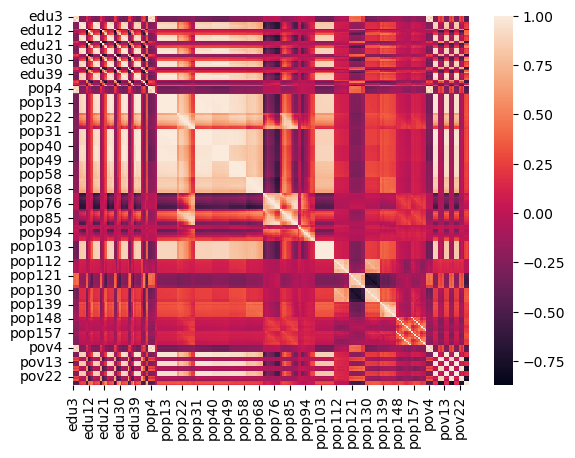

In [69]:
import seaborn as sns
cor = df.corr()
sns.heatmap(cor)

In [70]:
cor_matrix = df.corr().abs()
cor_matrix.head()

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\128247093.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_matrix = df.corr().abs()


,edu3,edu4,edu5,edu6,edu7,edu8,edu9,edu10,edu11,edu12,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
edu3,1.000000,0.887122,0.935032,0.839477,0.288030,0.292514,0.251692,0.279593,0.187831,0.112349,...,0.338751,0.293586,0.268332,0.314058,0.284650,0.175425,0.339218,0.475878,0.511488,0.434315
edu4,0.887122,1.000000,0.851154,0.927376,0.241150,0.243834,0.208975,0.232654,0.104679,0.061470,...,0.314342,0.246985,0.225085,0.264397,0.255772,0.152127,0.307717,0.420646,0.451204,0.395371
edu5,0.935032,0.851154,1.000000,0.888915,0.279377,0.282621,0.243470,0.270370,0.178471,0.101347,...,0.336190,0.286093,0.261126,0.306355,0.284506,0.176998,0.338126,0.476180,0.510548,0.435440
edu6,0.839477,0.927376,0.888915,1.000000,0.232441,0.234166,0.200552,0.223187,0.099628,0.054876,...,0.302528,0.238119,0.216549,0.255294,0.247576,0.146639,0.298201,0.413988,0.443982,0.388821
edu7,0.288030,0.241150,0.279377,0.232441,1.000000,0.965172,0.896972,0.907419,0.118571,0.057927,...,0.079047,0.837959,0.833755,0.839518,0.024536,0.066153,0.074548,0.165664,0.204346,0.124975


In [71]:
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
upper_tri.head()

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3930589694.py:1: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))


,edu3,edu4,edu5,edu6,edu7,edu8,edu9,edu10,edu11,edu12,...,pov18,pov19,pov20,pov21,pov22,pov23,pov24,pov25,pov26,pov27
edu3,NaN,0.887122,0.935032,0.839477,0.288030,0.292514,0.251692,0.279593,0.187831,0.112349,...,0.338751,0.293586,0.268332,0.314058,0.284650,0.175425,0.339218,0.475878,0.511488,0.434315
edu4,NaN,NaN,0.851154,0.927376,0.241150,0.243834,0.208975,0.232654,0.104679,0.061470,...,0.314342,0.246985,0.225085,0.264397,0.255772,0.152127,0.307717,0.420646,0.451204,0.395371
edu5,NaN,NaN,NaN,0.888915,0.279377,0.282621,0.243470,0.270370,0.178471,0.101347,...,0.336190,0.286093,0.261126,0.306355,0.284506,0.176998,0.338126,0.476180,0.510548,0.435440
edu6,NaN,NaN,NaN,NaN,0.232441,0.234166,0.200552,0.223187,0.099628,0.054876,...,0.302528,0.238119,0.216549,0.255294,0.247576,0.146639,0.298201,0.413988,0.443982,0.388821
edu7,NaN,NaN,NaN,NaN,NaN,0.965172,0.896972,0.907419,0.118571,0.057927,...,0.079047,0.837959,0.833755,0.839518,0.024536,0.066153,0.074548,0.165664,0.204346,0.124975


In [72]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.80)]
print(); print(to_drop)


['edu4', 'edu5', 'edu6', 'edu8', 'edu9', 'edu10', 'edu12', 'edu13', 'edu15', 'edu16', 'edu17', 'edu18', 'edu19', 'edu20', 'edu21', 'edu22', 'edu23', 'edu24', 'edu25', 'edu26', 'edu27', 'edu29', 'edu30', 'edu31', 'edu32', 'edu33', 'edu34', 'edu35', 'edu36', 'edu37', 'edu38', 'edu39', 'edu40', 'edu41', 'edu42', 'edu43', 'edu44', 'edu46', 'pop3', 'pop4', 'pop5', 'pop6', 'pop8', 'pop9', 'pop10', 'pop11', 'pop12', 'pop13', 'pop14', 'pop15', 'pop16', 'pop17', 'pop18', 'pop19', 'pop21', 'pop22', 'pop23', 'pop24', 'pop25', 'pop26', 'pop27', 'pop28', 'pop29', 'pop30', 'pop31', 'pop32', 'pop33', 'pop34', 'pop35', 'pop36', 'pop37', 'pop38', 'pop39', 'pop40', 'pop41', 'pop42', 'pop43', 'pop44', 'pop45', 'pop46', 'pop47', 'pop48', 'pop49', 'pop50', 'pop51', 'pop52', 'pop53', 'pop54', 'pop55', 'pop56', 'pop57', 'pop58', 'pop59', 'pop60', 'pop61', 'pop62', 'pop63', 'pop64', 'pop65', 'pop66', 'pop68', 'Unnamed: 68', 'pop69', 'pop71', 'pop72', 'pop74', 'Unnamed: 74', 'pop75', 'pop76', 'pop77', 'pop78'

In [73]:
df1 = df.drop(['edu4', 'edu5', 'edu6', 'edu8', 'edu9', 'edu10', 'edu12', 'edu13', 'edu15', 'edu16', 'edu17', 'edu18', 'edu19', 'edu20', 'edu21', 'edu22', 'edu23', 'edu24', 'edu25', 'edu26', 'edu27', 'edu29', 'edu30', 'edu31', 'edu32', 'edu33', 'edu34', 'edu35', 'edu36', 'edu37', 'edu38', 'edu39', 'edu40', 'edu41', 'edu42', 'edu43', 'edu44', 'edu46', 'pop3', 'pop4', 'pop5', 'pop6', 'pop8', 'pop9', 'pop10', 'pop11', 'pop12', 'pop13', 'pop14', 'pop15', 'pop16', 'pop17', 'pop18', 'pop19', 'pop21', 'pop22', 'pop23', 'pop24', 'pop25', 'pop26', 'pop27', 'pop28', 'pop29', 'pop30', 'pop31', 'pop32', 'pop33', 'pop34', 'pop35', 'pop36', 'pop37', 'pop38', 'pop39', 'pop40', 'pop41', 'pop42', 'pop43', 'pop44', 'pop45', 'pop46', 'pop47', 'pop48', 'pop49', 'pop50', 'pop51', 'pop52', 'pop53', 'pop54', 'pop55', 'pop56', 'pop57', 'pop58', 'pop59', 'pop60', 'pop61', 'pop62', 'pop63', 'pop64', 'pop65', 'pop66', 'pop68', 'Unnamed: 68', 'pop69', 'pop71', 'pop72', 'pop74', 'Unnamed: 74', 'pop75', 'pop76', 'pop77', 'pop78', 'pop79', 'pop80', 'pop82', 'pop83', 'pop84', 'pop85', 'pop86', 'pop87', 'pop88', 'pop89', 'pop95', 'pop96', 'pop98', 'pop99', 'pop100', 'pop101', 'pop102', 'pop103', 'pop104', 'pop105', 'pop106', 'pop107', 'pop108', 'pop109', 'pop110', 'pop112', 'pop113', 'pop114', 'pop115', 'pop116', 'pop117', 'pop118', 'pop119', 'pop122', 'pop123', 'pop124', 'pop125', 'pop126', 'pop128', 'pop129', 'pop130', 'pop131', 'pop132', 'pop133', 'pop134', 'pop135', 'pop136', 'pop137', 'pop140', 'pop141', 'pop142', 'pop143', 'pop144', 'pop145', 'pop146', 'pop156', 'pop157', 'pop158', 'pop159', 'pop160', 'pop161', 'pop162', 'pop163', 'pop164', 'pov3', 'pov4', 'pov5', 'pov6', 'pov7', 'pov8', 'pov9', 'pov11', 'pov12', 'pov13', 'pov14', 'pov15', 'pov16', 'pov17', 'pov18', 'pov19', 'pov20', 'pov21', 'pov22', 'pov23', 'pov24', 'pov26', 'pov27'], axis=1)
df1

,state_name,county_fips,county_name,victory,edu3,edu7,edu11,edu14,edu28,edu45,...,pop148,pop149,pop150,pop151,pop152,pop153,pop154,pop155,pov10,pov25
0,Alabama,1001,Autauga County,republican_party,2,6611,54.8,6.4,32.0,28.356571,...,-5.971992,-4.121042,1.842729,-1.949762,4.831664,1.066590,0.667129,4.847310,12.1,58233
1,Alabama,1003,Baldwin County,republican_party,4,18726,59.4,6.5,31.8,31.284081,...,16.219674,21.691816,19.610829,17.074420,20.402397,21.988851,24.276447,24.017829,10.1,59871
2,Alabama,1005,Barbour County,republican_party,6,8120,68.8,7.3,27.1,26.029837,...,-6.457531,-7.762540,-5.289429,-16.214789,-18.890745,-25.469458,-9.234644,-5.690302,27.1,35972
3,Alabama,1007,Bibb County,republican_party,1,5272,73.1,4.2,33.8,23.800098,...,-4.624328,-6.683190,0.709944,0.753563,-1.328845,-3.677774,-7.302358,1.385134,20.3,47918
4,Alabama,1009,Blount County,republican_party,1,10677,70.5,2.7,34.7,33.975021,...,-1.737016,-1.128482,-2.744366,-1.564510,-1.773605,6.210911,-0.155766,1.020788,16.3,52902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3147,Wyoming,56037,Sweetwater County,republican_party,5,4393,43.6,9.5,37.5,37.246979,...,15.777408,-6.189066,-12.141391,-14.453478,-18.664058,-24.131560,-19.253493,-17.605427,8.3,80639
3148,Wyoming,56039,Teton County,democratic_party,7,708,27.3,17.5,28.5,23.304277,...,1.301176,18.207060,13.795245,1.571366,-1.426071,-4.375992,-16.204746,-1.583464,6.0,98837
3149,Wyoming,56041,Uinta County,republican_party,7,1569,40.4,9.1,39.2,35.189754,...,-3.723861,-10.107993,-14.363345,-10.436455,-11.340331,-18.923455,-13.554993,-9.181105,8.5,70756
3150,Wyoming,56043,Washakie County,republican_party,7,1572,39.0,10.7,34.5,36.620987,...,-2.965951,-1.188919,-18.698310,0.483354,-14.595877,-15.332303,-16.617360,-7.652085,11.1,55122


In [74]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
edu3,3152.0,5.120241,2.665019,1.000000,3.000000,6.000000,7.000000,9.000000e+00
edu7,3152.0,16631.692576,57024.959872,33.000000,2914.000000,5860.000000,11869.000000,1.506170e+06
edu11,3152.0,55.281313,12.666873,11.800000,45.900000,53.700000,65.700000,8.840000e+01
edu14,3152.0,7.271986,3.922675,0.000000,4.800000,6.300000,8.600000,3.860000e+01
edu28,3152.0,34.268433,6.111190,13.500000,30.400000,33.700000,38.500000,5.260000e+01
edu45,3152.0,30.773143,5.185414,5.235602,27.325159,30.699049,34.179402,6.056338e+01
pop7,3152.0,1.772525,1.813933,0.000000,0.000000,1.000000,3.000000,5.000000e+00
pop20,3152.0,177.633249,769.939731,-5392.000000,-17.250000,8.000000,74.000000,1.449000e+04
pop70,3152.0,-0.370558,587.921379,-21753.000000,-31.000000,0.000000,25.000000,7.502000e+03
pop81,3152.0,245.552982,1862.237150,-21282.000000,-125.000000,-16.000000,91.000000,2.746300e+04


In [75]:
pivot_ui(df1)

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3211091605.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_ = df1.corr()


<AxesSubplot:>

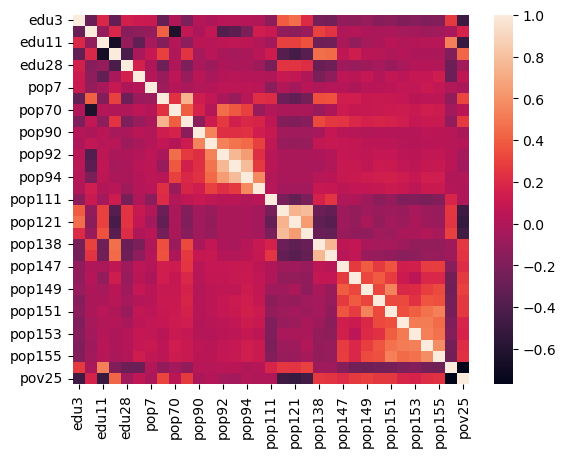

In [76]:
# Corrélation dans les données
cor_ = df1.corr()
sns.heatmap(cor_)

In [77]:
df1.corr("spearman")

C:\Users\hp\AppData\Local\Temp\ipykernel_12000\3704859344.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df1.corr("spearman")


,edu3,edu7,edu11,edu14,edu28,edu45,pop7,pop20,pop70,pop81,...,pop148,pop149,pop150,pop151,pop152,pop153,pop154,pop155,pov10,pov25
edu3,1.000000,-0.652034,0.168235,-0.303758,0.142070,0.113411,0.167737,-0.366847,-0.055289,-0.107331,...,-0.170725,-0.148890,-0.189908,-0.176707,-0.204124,-0.182249,-0.200920,-0.196694,0.254085,-0.439175
edu7,-0.652034,1.000000,-0.063259,0.269855,-0.176379,-0.184030,-0.155943,0.272006,-0.051738,0.029714,...,0.102757,0.039059,0.055079,0.039391,0.018164,-0.019671,0.016096,0.016548,0.002476,0.169452
edu11,0.168235,-0.063259,1.000000,-0.714222,-0.141881,-0.341209,-0.040382,-0.155702,0.080439,-0.104787,...,-0.124434,-0.059798,-0.008317,0.029370,0.004955,0.032640,0.039586,0.030346,0.524208,-0.538329
edu14,-0.303758,0.269855,-0.714222,1.000000,-0.284497,0.149617,0.052755,0.282728,-0.029439,0.156379,...,0.154597,0.077002,0.045147,0.021073,0.018432,-0.029373,-0.018105,-0.001764,-0.254632,0.396587
edu28,0.142070,-0.176379,-0.141881,-0.284497,1.000000,0.147867,0.002860,-0.282507,-0.101082,-0.167160,...,-0.141958,-0.104649,-0.062138,-0.116937,-0.039946,0.012031,0.027191,-0.010813,-0.256466,0.071229
edu45,0.113411,-0.184030,-0.341209,0.149617,0.147867,1.000000,0.035882,-0.036130,0.033330,-0.026972,...,0.039741,0.052155,0.033146,0.049033,0.083214,0.100356,0.089102,0.110076,-0.270952,0.200046
pop7,0.167737,-0.155943,-0.040382,0.052755,0.002860,0.035882,1.000000,-0.104035,-0.030783,0.005365,...,-0.020921,0.019431,0.013609,0.022795,0.028217,0.035490,0.061437,0.053290,0.018636,-0.019503
pop20,-0.366847,0.272006,-0.155702,0.282728,-0.282507,-0.036130,-0.104035,1.000000,0.597402,0.383135,...,0.298695,0.219512,0.241773,0.236780,0.211803,0.187493,0.172318,0.190474,-0.183466,0.328834
pop70,-0.055289,-0.051738,0.080439,-0.029439,-0.101082,0.033330,-0.030783,0.597402,1.000000,0.406603,...,0.309438,0.287214,0.307867,0.330807,0.321939,0.317457,0.299333,0.306592,-0.106860,0.106633
pop81,-0.107331,0.029714,-0.104787,0.156379,-0.167160,-0.026972,0.005365,0.383135,0.406603,1.000000,...,0.406768,0.365920,0.345399,0.334814,0.282559,0.238231,0.253350,0.256158,-0.202320,0.242606


C:\Users\hp\AppData\Local\Temp\ipykernel_12000\2143754546.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df1.corr()


Text(0.5, 1.0, 'Corrélations après correction')

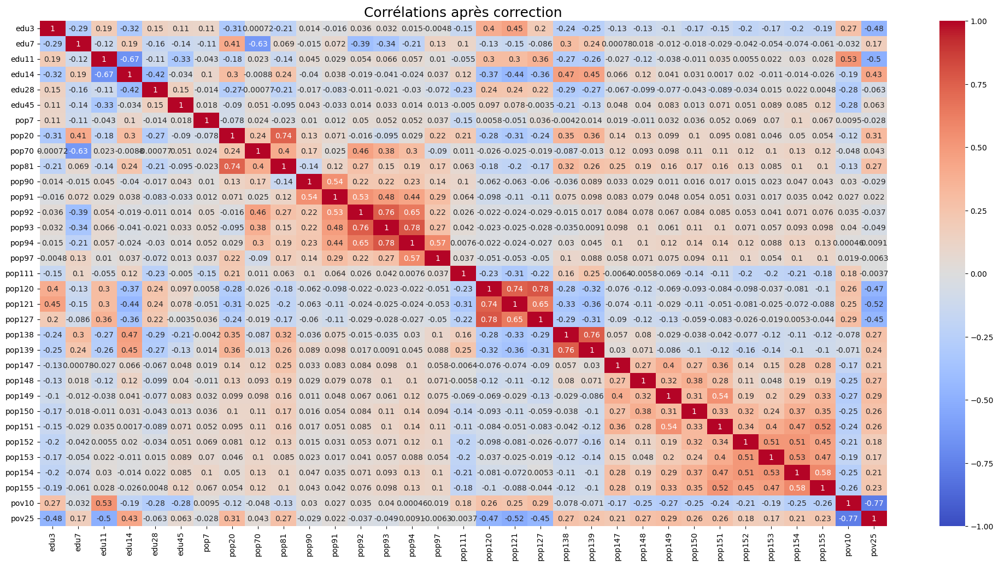

In [78]:
## Visualisation chiffrée de la corrélation après correction
corr = df1.corr()
fig, ax = plt.subplots(figsize=(25, 12))
ax = sns.heatmap(corr, cmap="coolwarm",center=0, annot = True, vmin= -1, vmax = 1)
ax.set_title("Corrélations après correction", size=18)

In [79]:
# Histogramme et graphiques d'analyse
### Variables quantitatives
var_quanti = [
    quanti for quanti in df1.columns if df1[quanti].dtype in ['float64']
    ]
df_quanti = df1[var_quanti]
print(df_quanti.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3152 entries, 0 to 3151
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   edu11   3152 non-null   float64
 1   edu14   3152 non-null   float64
 2   edu28   3152 non-null   float64
 3   edu45   3152 non-null   float64
 4   pop111  3152 non-null   float64
 5   pop120  3152 non-null   float64
 6   pop121  3152 non-null   float64
 7   pop127  3152 non-null   float64
 8   pop138  3152 non-null   float64
 9   pop139  3152 non-null   float64
 10  pop147  3152 non-null   float64
 11  pop148  3152 non-null   float64
 12  pop149  3152 non-null   float64
 13  pop150  3152 non-null   float64
 14  pop151  3152 non-null   float64
 15  pop152  3152 non-null   float64
 16  pop153  3152 non-null   float64
 17  pop154  3152 non-null   float64
 18  pop155  3152 non-null   float64
 19  pov10   3152 non-null   float64
dtypes: float64(20)
memory usage: 517.1 KB
None


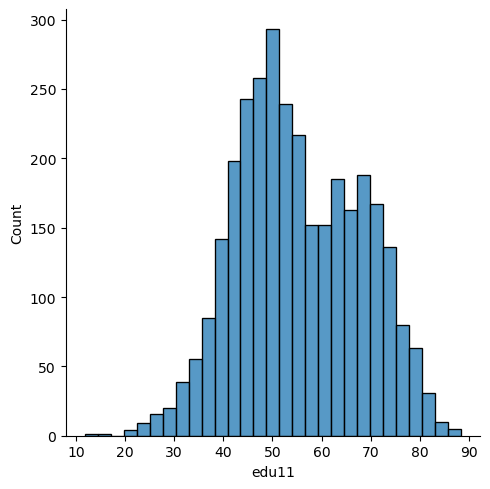

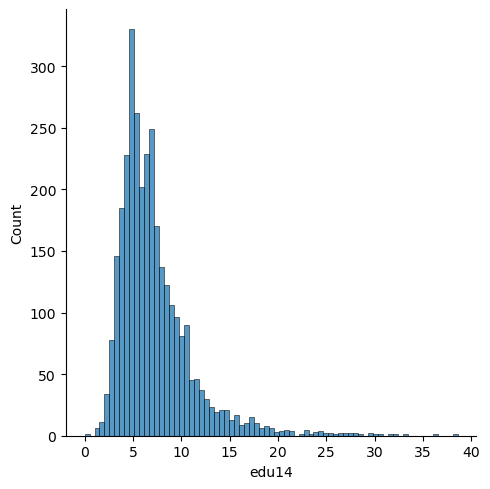

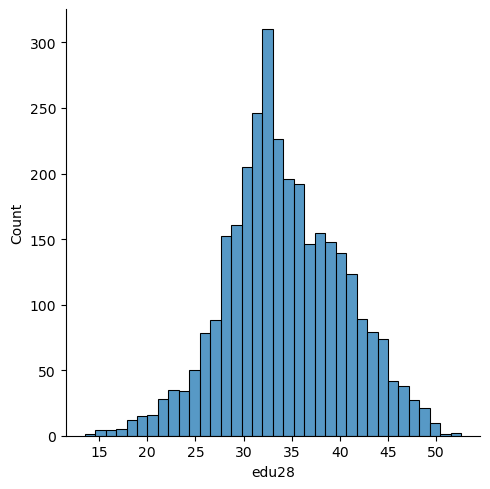

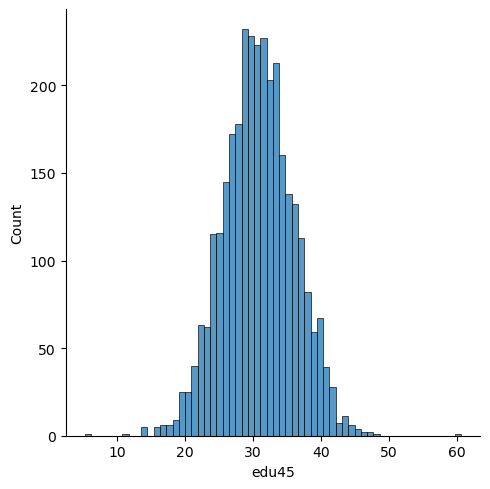

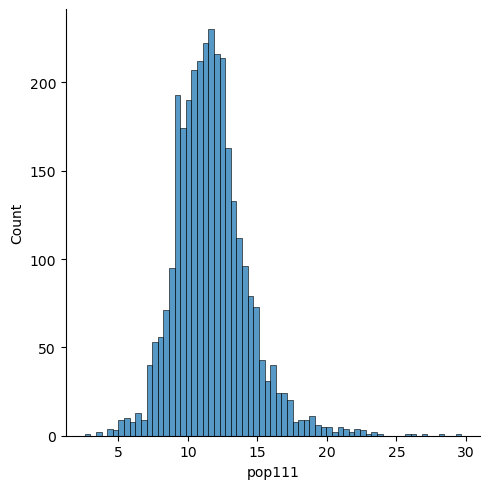

...

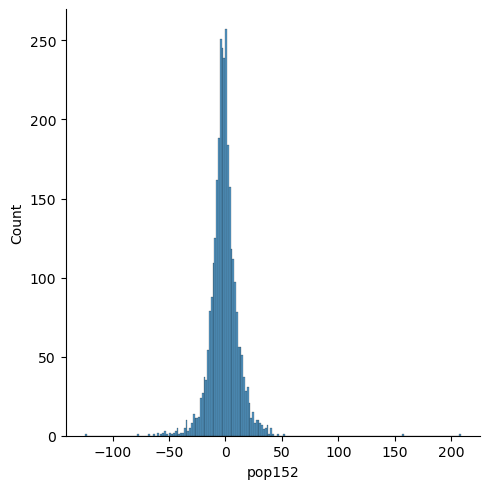

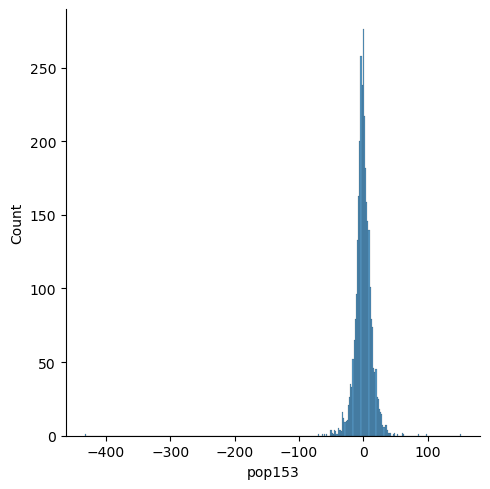

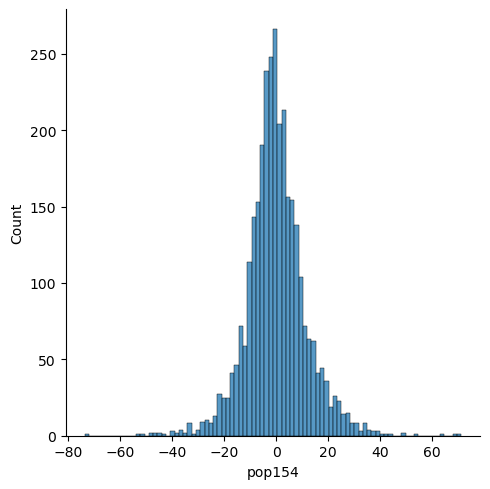

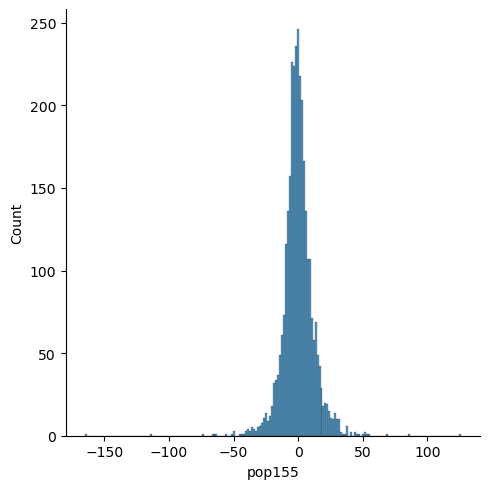

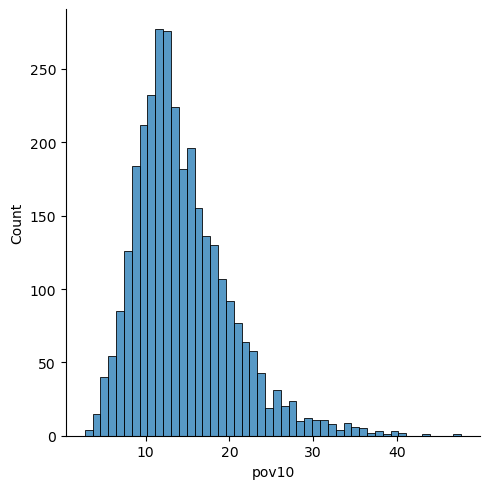

In [80]:
## Afficher les histogrammes des variables quantitatives
import seaborn as sns
for col in df_quanti :
    x = df_quanti[col]
    sns.displot(x)
    plt.show()

<AxesSubplot:>

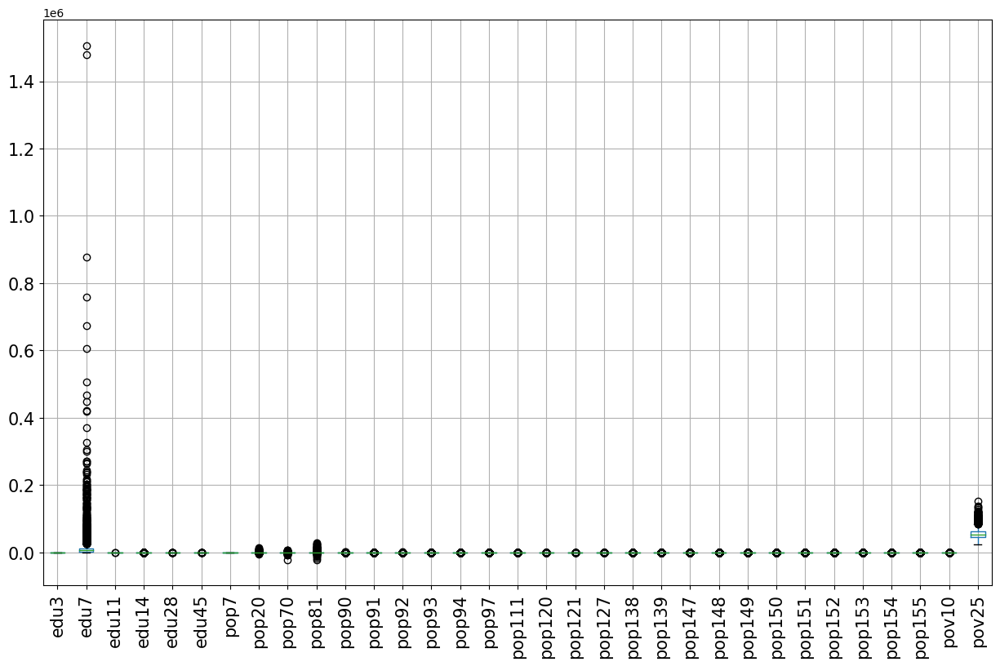

In [81]:
# Exploration des outliers
df1.boxplot(figsize=(15,9),rot=90, fontsize = 15)

In [82]:
df1.head()

,state_name,county_fips,county_name,victory,edu3,edu7,edu11,edu14,edu28,edu45,...,pop148,pop149,pop150,pop151,pop152,pop153,pop154,pop155,pov10,pov25
0,Alabama,1001,Autauga County,republican_party,2,6611,54.8,6.4,32.0,28.356571,...,-5.971992,-4.121042,1.842729,-1.949762,4.831664,1.066590,0.667129,4.847310,12.1,58233
1,Alabama,1003,Baldwin County,republican_party,4,18726,59.4,6.5,31.8,31.284081,...,16.219674,21.691816,19.610829,17.074420,20.402397,21.988851,24.276447,24.017829,10.1,59871
2,Alabama,1005,Barbour County,republican_party,6,8120,68.8,7.3,27.1,26.029837,...,-6.457531,-7.762540,-5.289429,-16.214789,-18.890745,-25.469458,-9.234644,-5.690302,27.1,35972
3,Alabama,1007,Bibb County,republican_party,1,5272,73.1,4.2,33.8,23.800098,...,-4.624328,-6.683190,0.709944,0.753563,-1.328845,-3.677774,-7.302358,1.385134,20.3,47918
4,Alabama,1009,Blount County,republican_party,1,10677,70.5,2.7,34.7,33.975021,...,-1.737016,-1.128482,-2.744366,-1.564510,-1.773605,6.210911,-0.155766,1.020788,16.3,52902


In [83]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
edu3,3152.0,5.120241,2.665019,1.000000,3.000000,6.000000,7.000000,9.000000e+00
edu7,3152.0,16631.692576,57024.959872,33.000000,2914.000000,5860.000000,11869.000000,1.506170e+06
edu11,3152.0,55.281313,12.666873,11.800000,45.900000,53.700000,65.700000,8.840000e+01
edu14,3152.0,7.271986,3.922675,0.000000,4.800000,6.300000,8.600000,3.860000e+01
edu28,3152.0,34.268433,6.111190,13.500000,30.400000,33.700000,38.500000,5.260000e+01
edu45,3152.0,30.773143,5.185414,5.235602,27.325159,30.699049,34.179402,6.056338e+01
pop7,3152.0,1.772525,1.813933,0.000000,0.000000,1.000000,3.000000,5.000000e+00
pop20,3152.0,177.633249,769.939731,-5392.000000,-17.250000,8.000000,74.000000,1.449000e+04
pop70,3152.0,-0.370558,587.921379,-21753.000000,-31.000000,0.000000,25.000000,7.502000e+03
pop81,3152.0,245.552982,1862.237150,-21282.000000,-125.000000,-16.000000,91.000000,2.746300e+04


In [84]:
df1['victory'] = df1['victory'].map({'republican_party': 1, 'democratic_party': 0}).astype(int)
df1

,state_name,county_fips,county_name,victory,edu3,edu7,edu11,edu14,edu28,edu45,...,pop148,pop149,pop150,pop151,pop152,pop153,pop154,pop155,pov10,pov25
0,Alabama,1001,Autauga County,1,2,6611,54.8,6.4,32.0,28.356571,...,-5.971992,-4.121042,1.842729,-1.949762,4.831664,1.066590,0.667129,4.847310,12.1,58233
1,Alabama,1003,Baldwin County,1,4,18726,59.4,6.5,31.8,31.284081,...,16.219674,21.691816,19.610829,17.074420,20.402397,21.988851,24.276447,24.017829,10.1,59871
2,Alabama,1005,Barbour County,1,6,8120,68.8,7.3,27.1,26.029837,...,-6.457531,-7.762540,-5.289429,-16.214789,-18.890745,-25.469458,-9.234644,-5.690302,27.1,35972
3,Alabama,1007,Bibb County,1,1,5272,73.1,4.2,33.8,23.800098,...,-4.624328,-6.683190,0.709944,0.753563,-1.328845,-3.677774,-7.302358,1.385134,20.3,47918
4,Alabama,1009,Blount County,1,1,10677,70.5,2.7,34.7,33.975021,...,-1.737016,-1.128482,-2.744366,-1.564510,-1.773605,6.210911,-0.155766,1.020788,16.3,52902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3147,Wyoming,56037,Sweetwater County,1,5,4393,43.6,9.5,37.5,37.246979,...,15.777408,-6.189066,-12.141391,-14.453478,-18.664058,-24.131560,-19.253493,-17.605427,8.3,80639
3148,Wyoming,56039,Teton County,0,7,708,27.3,17.5,28.5,23.304277,...,1.301176,18.207060,13.795245,1.571366,-1.426071,-4.375992,-16.204746,-1.583464,6.0,98837
3149,Wyoming,56041,Uinta County,1,7,1569,40.4,9.1,39.2,35.189754,...,-3.723861,-10.107993,-14.363345,-10.436455,-11.340331,-18.923455,-13.554993,-9.181105,8.5,70756
3150,Wyoming,56043,Washakie County,1,7,1572,39.0,10.7,34.5,36.620987,...,-2.965951,-1.188919,-18.698310,0.483354,-14.595877,-15.332303,-16.617360,-7.652085,11.1,55122


In [85]:
# Extraction df1
df1.to_csv('electionUS.csv', encoding='utf-8', index = False, sep=',')

In [86]:
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split

C:\Users\hp\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [87]:
# III. Modélisation prédictive

# Split de la base de données

X = df1.drop(['victory', 'state_name', 'county_fips', 'county_name'],axis=1)
X.head()

,edu3,edu7,edu11,edu14,edu28,edu45,pop7,pop20,pop70,pop81,...,pop148,pop149,pop150,pop151,pop152,pop153,pop154,pop155,pov10,pov25
0,2,6611,54.80,6.40,32.00,28.36,0,176,147,331,...,-5.97,-4.12,1.84,-1.95,4.83,1.07,0.67,4.85,12.10,58233
1,4,18726,59.40,6.50,31.80,31.28,5,847,782,3076,...,16.22,21.69,19.61,17.07,20.40,21.99,24.28,24.02,10.10,59871
2,6,8120,68.80,7.30,27.10,26.03,3,-128,-69,8,...,-6.46,-7.76,-5.29,-16.21,-18.89,-25.47,-9.23,-5.69,27.10,35972
3,1,5272,73.10,4.20,33.80,23.80,0,-45,-59,-114,...,-4.62,-6.68,0.71,0.75,-1.33,-3.68,-7.30,1.39,20.30,47918
4,1,10677,70.50,2.70,34.70,33.98,0,54,9,12,...,-1.74,-1.13,-2.74,-1.56,-1.77,6.21,-0.16,1.02,16.30,52902


In [88]:
# Normalization
X['log_pov25'] = np.log10(X['pov25'])
X['log_edu7'] = np.log10(X['edu7'])
X.head()

,edu3,edu7,edu11,edu14,edu28,edu45,pop7,pop20,pop70,pop81,...,pop150,pop151,pop152,pop153,pop154,pop155,pov10,pov25,log_pov25,log_edu7
0,2,6611,54.80,6.40,32.00,28.36,0,176,147,331,...,1.84,-1.95,4.83,1.07,0.67,4.85,12.10,58233,4.77,3.82
1,4,18726,59.40,6.50,31.80,31.28,5,847,782,3076,...,19.61,17.07,20.40,21.99,24.28,24.02,10.10,59871,4.78,4.27
2,6,8120,68.80,7.30,27.10,26.03,3,-128,-69,8,...,-5.29,-16.21,-18.89,-25.47,-9.23,-5.69,27.10,35972,4.56,3.91
3,1,5272,73.10,4.20,33.80,23.80,0,-45,-59,-114,...,0.71,0.75,-1.33,-3.68,-7.30,1.39,20.30,47918,4.68,3.72
4,1,10677,70.50,2.70,34.70,33.98,0,54,9,12,...,-2.74,-1.56,-1.77,6.21,-0.16,1.02,16.30,52902,4.72,4.03


In [89]:
Xs = X.drop(['edu7', 'pov25'],axis=1)
Xs.head()

,edu3,edu11,edu14,edu28,edu45,pop7,pop20,pop70,pop81,pop90,...,pop149,pop150,pop151,pop152,pop153,pop154,pop155,pov10,log_pov25,log_edu7
0,2,54.80,6.40,32.00,28.36,0,176,147,331,11,...,-4.12,1.84,-1.95,4.83,1.07,0.67,4.85,12.10,4.77,3.82
1,4,59.40,6.50,31.80,31.28,5,847,782,3076,46,...,21.69,19.61,17.07,20.40,21.99,24.28,24.02,10.10,4.78,4.27
2,6,68.80,7.30,27.10,26.03,3,-128,-69,8,2,...,-7.76,-5.29,-16.21,-18.89,-25.47,-9.23,-5.69,27.10,4.56,3.91
3,1,73.10,4.20,33.80,23.80,0,-45,-59,-114,2,...,-6.68,0.71,0.75,-1.33,-3.68,-7.30,1.39,20.30,4.68,3.72
4,1,70.50,2.70,34.70,33.98,0,54,9,12,-6,...,-1.13,-2.74,-1.56,-1.77,6.21,-0.16,1.02,16.30,4.72,4.03


In [90]:
y = df1.drop(['pop97','edu7','pop111','pop120','pop121','pop127','pop138','pop139','pop147', 'edu3', 'edu11','edu14','edu28','edu45','pop7','pop20','pop70','state_name','county_fips','county_name','pop81','pop90','pop91','pop148','pop149','pop92','pop93','pop94','pop150','pop151','pop152','pop153','pop154','pop155','pov10','pov25'], axis=1)
y.head()

,victory
0,1
1,1
2,1
3,1
4,1


In [91]:
X_train, X_test, y_train, y_test = train_test_split(Xs, y,test_size=.2,random_state =123)

In [92]:
# Scaling des données d'entraînement

from sklearn.preprocessing import StandardScaler
s = StandardScaler()
X_trains = s.fit_transform(X_train)
X_tests = s.fit_transform(X_test)

In [93]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_trains, X_tests, y_train, y_test)

models

 93%|█████████▎| 27/29 [00:10<00:00,  3.43it/s]

[13:20:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|██████████| 29/29 [00:12<00:00,  2.33it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
PassiveAggressiveClassifier,0.84,0.80,0.80,0.85,0.04
LGBMClassifier,0.90,0.80,0.80,0.90,0.51
LabelPropagation,0.87,0.79,0.79,0.87,0.84
LabelSpreading,0.87,0.79,0.79,0.87,1.00
XGBClassifier,0.90,0.79,0.79,0.90,1.39
KNeighborsClassifier,0.90,0.78,0.78,0.89,0.13
SVC,0.90,0.78,0.78,0.89,0.55
RandomForestClassifier,0.89,0.77,0.77,0.88,1.95
BaggingClassifier,0.86,0.77,0.77,0.86,1.15


In [94]:
pivot_ui(models)

In [95]:
models.max()

Accuracy            0.90
Balanced Accuracy   0.80
ROC AUC             0.80
F1 Score            0.90
Time Taken          1.95
dtype: float64

In [96]:
# XGBMClassifier Modelization
from xgboost import XGBClassifier

In [97]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score, KFold

In [98]:
xgbc = XGBClassifier()
print(xgbc)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='multi:softprob', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None,
              enable_categorical=False, gamma=None, gpu_id=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, reg_alpha=None,
              reg_lambda=None, scale_pos_weight=None, subsample=None,
              tree_method=None, validate_parameters=None, verbosity=None)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_delta_step=0,
              max_depth=3, min_child_weight=1, missing=None,
              monotone_constraints=None, n_estimators=100, n_jobs=1,
              nthread=None, num_parallel_tree=None, objective='multi:softprob',
              predictor=None, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, seed=None, silent=None, subsample=1,
              tree_method=None, ...)

In [99]:
xgbc.fit(X_trains, y_train)

[13:20:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=4,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [100]:
scores = cross_val_score(xgbc, X_trains, y_train, cv=5)
print("Mean cross-validation score: %.2f" % scores.mean())

[13:20:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:20:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:20:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:20:26] WARNING:

In [101]:
kfold = KFold(n_splits=10, shuffle=True)
kf_cv_scores = cross_val_score(xgbc, X_trains, y_train, cv=kfold )
print("K-fold CV average score: %.2f" % kf_cv_scores.mean())

[13:20:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:20:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:20:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:20:32] WARNING:

In [102]:
y_pred = xgbc.predict(X_tests)
cm = confusion_matrix(y_test,y_pred) 

print(cm)

[[ 74  45]
 [ 18 494]]


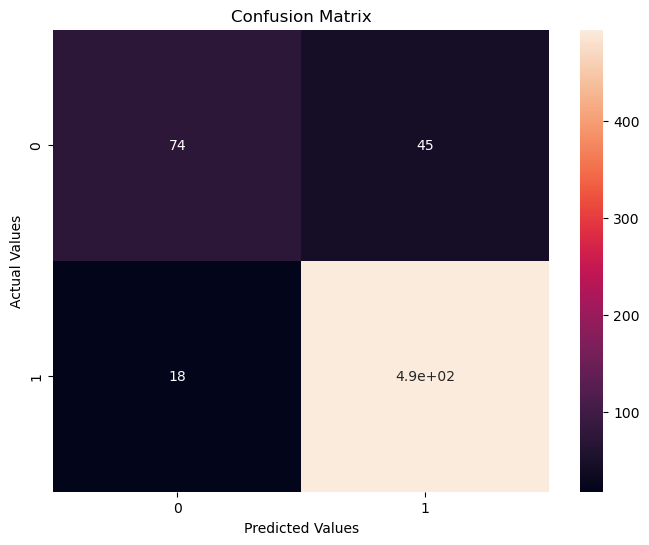

In [103]:
#Plotting the confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

In [104]:
# IV.2.2. Importance des variables par l'approche de Shapley Values
import shap
shap.initjs()
# Explicabilité de la prédiction XGBClassifier
explainers = shap.TreeExplainer(xgbc)
shap_values = explainers.shap_values(X_trains)

In [105]:
# visualisation entrainement
shap.force_plot(explainers.expected_value, shap_values, X_trains)

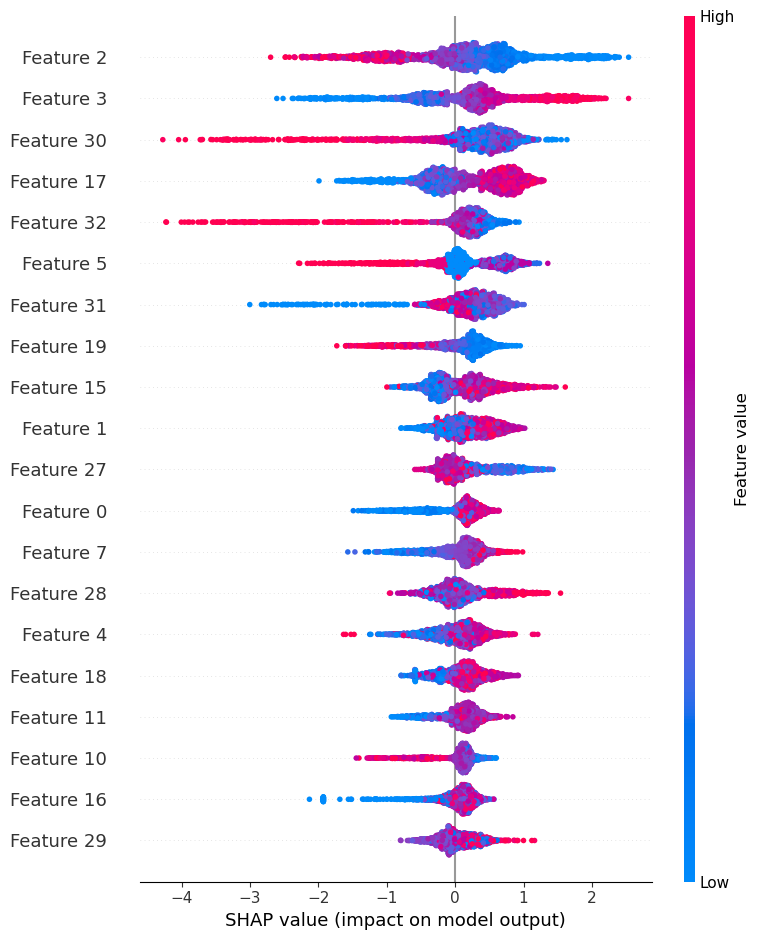

In [106]:
# Visualisation
shap.summary_plot(shap_values, X_trains)

In [107]:
explainers = shap.TreeExplainer(xgbc)
expected_value = explainers.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

Explainer expected value: [2.00612758]


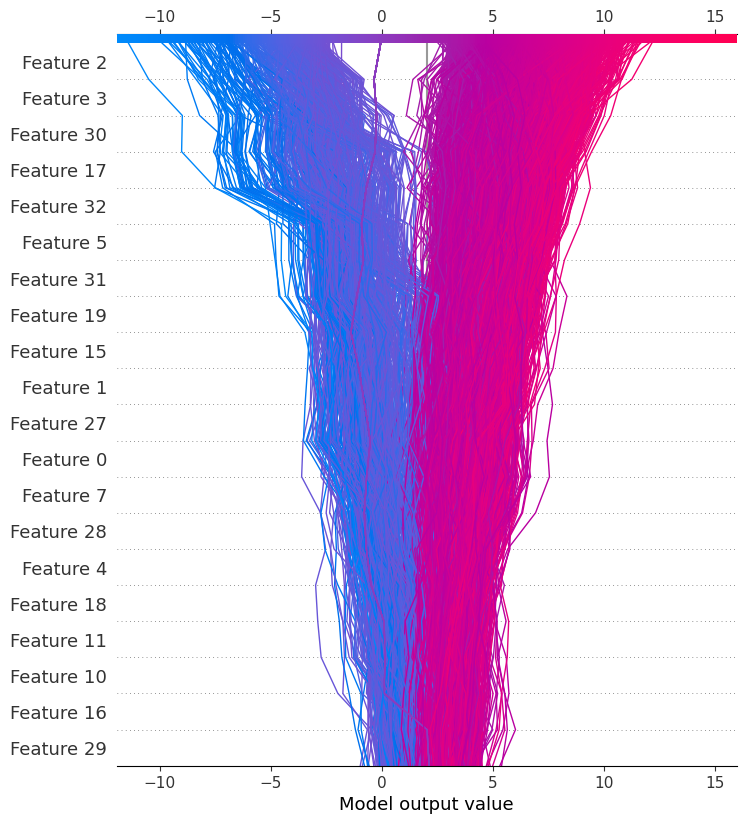

In [108]:
import warnings
shap.decision_plot(expected_value, shap_values, X_trains, ignore_warnings=True)

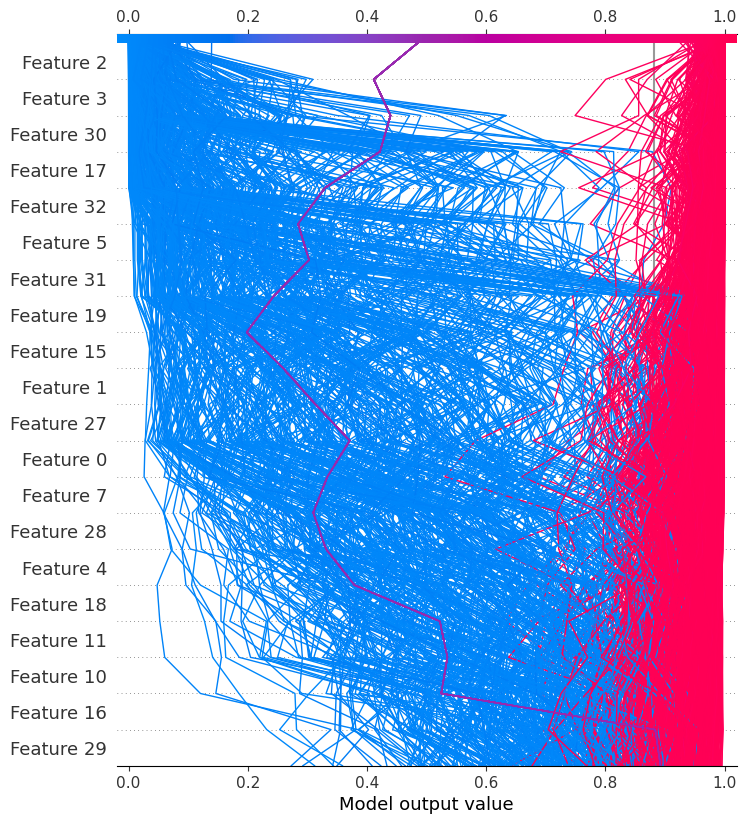

In [109]:
shap.decision_plot(expected_value, shap_values, X_trains, link='logit', ignore_warnings=True)

1. log_edu7 (0.161613)
2. edu14 (0.064074)
3. edu28 (0.060143)
4. pop120 (0.045221)
5. pov10 (0.044076)
6. pop7 (0.041097)
7. pop139 (0.031972)
8. edu3 (0.030431)
9. pop138 (0.030354)
10. pop70 (0.029892)
11. pop93 (0.029247)
12. log_pov25 (0.026147)
13. pop97 (0.025342)
14. pop81 (0.024926)
15. edu45 (0.024058)
16. edu11 (0.023390)
17. pop111 (0.023059)
18. pop121 (0.022440)
19. pop127 (0.021038)
20. pop155 (0.020212)
21. pop153 (0.020039)
22. pop149 (0.019716)
23. pop148 (0.019142)
24. pop151 (0.018662)
25. pop154 (0.018439)
26. pop147 (0.018341)
27. pop90 (0.017608)
28. pop94 (0.017572)
29. pop91 (0.016997)
30. pop152 (0.015880)
31. pop92 (0.015796)
32. pop150 (0.011623)
33. pop20 (0.011454)


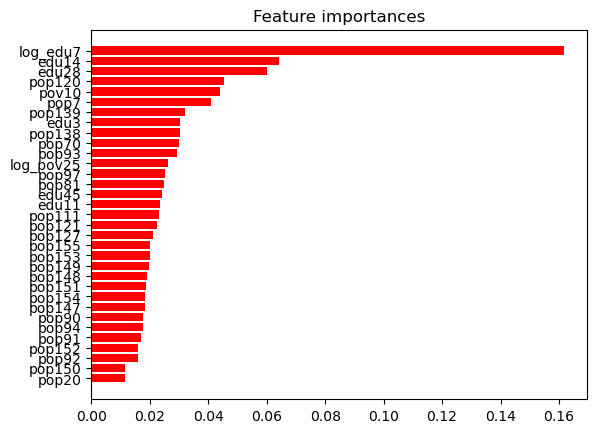

In [110]:
coef = xgbc.feature_importances_
ind = np.argsort(-coef)
for i in range(X_tests.shape[1]):
    print("%d. %s (%f)" % (i + 1, Xs.columns[ind[i]], coef[ind[i]]))
x = range(X_tests.shape[1])
y = coef[ind][:Xs.shape[1]]
plt.title("Feature importances")
ax = plt.subplot()
plt.barh(x, y, color='red')
ax.set_yticks(x)
ax.set_yticklabels(Xs.columns[ind])
plt.gca().invert_yaxis()

In [111]:
# IV. Importances des variables par la valeur de Shapley

In [112]:
#  IV.2.2. Utilisons le RandomForest
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth=6, random_state=123, n_estimators=10)
model.fit(X_trains, y_train)

RandomForestRegressor(max_depth=6, n_estimators=10, random_state=123)

In [113]:
# Prediction Random
y_pred = model.predict(X_tests)

In [114]:
# IV.2.2. Importance des variables par l'approche de Shapley Values
import shap

# Explicabilité de la prédiction Random Forest
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_trains)

In [115]:
# visualisation entrainement
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_trains)

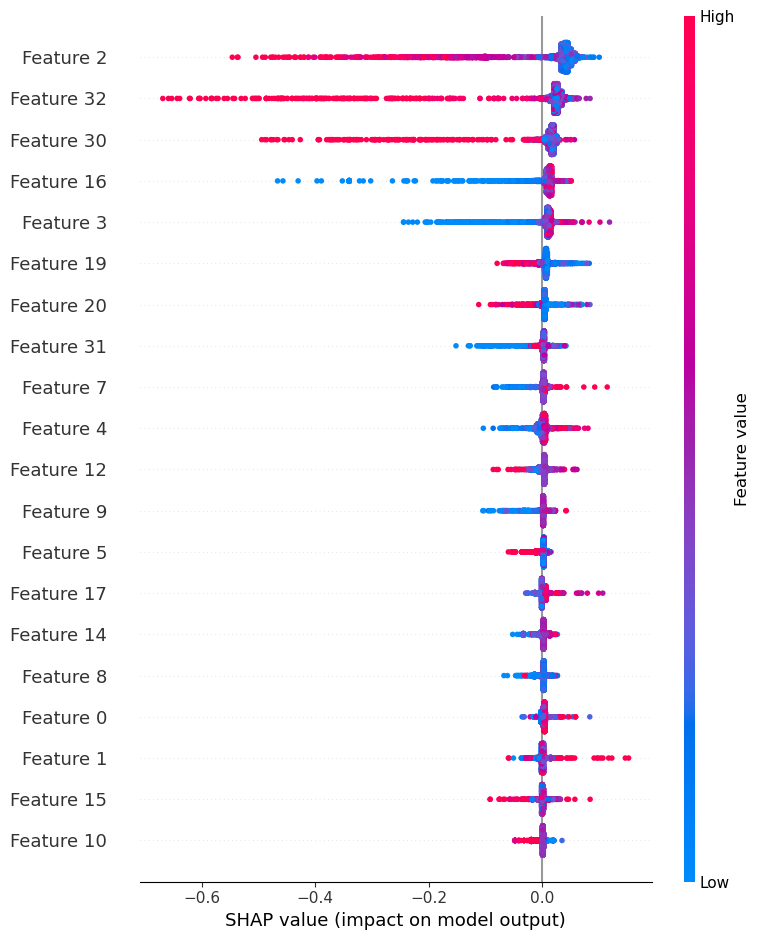

In [116]:
# Visualisation
shap.summary_plot(shap_values, X_trains)

In [117]:
explainer = shap.TreeExplainer(model)
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

Explainer expected value: [0.81293138]


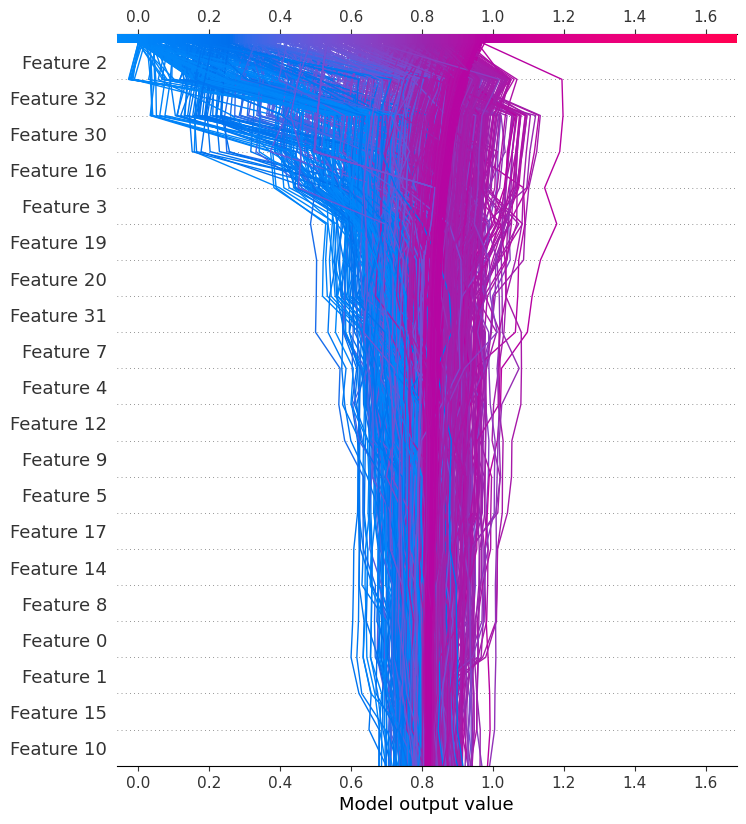

In [118]:
import warnings
shap.decision_plot(expected_value, shap_values, X_trains, ignore_warnings=True)

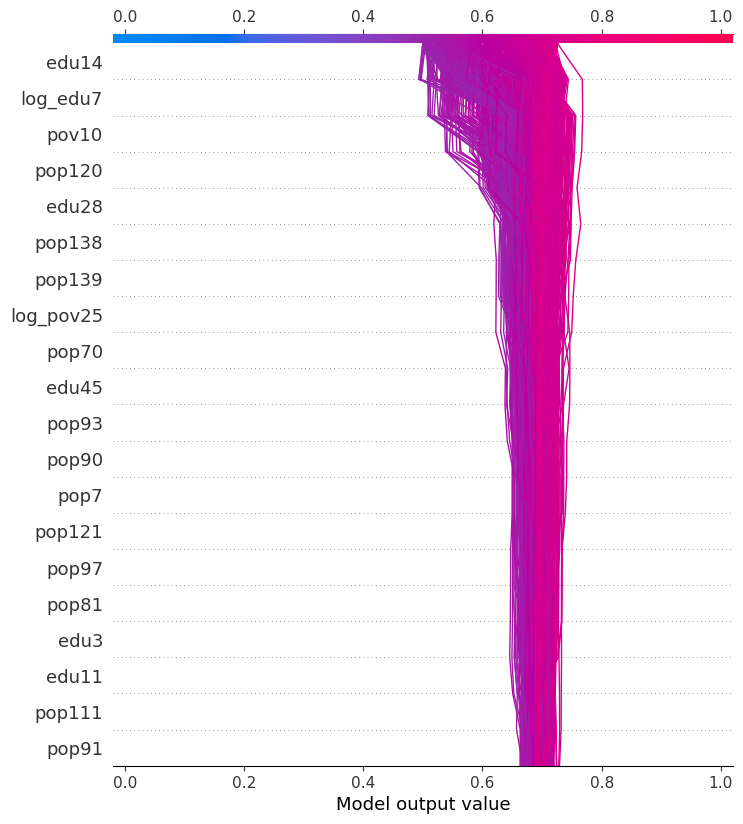

In [119]:
shap.decision_plot(expected_value, shap_values, X_train, link='logit', ignore_warnings=True)

1. log_edu7 (0.237261)
2. edu14 (0.196165)
3. pov10 (0.076115)
4. edu28 (0.067611)
5. pop120 (0.052778)
6. pop138 (0.039350)
7. log_pov25 (0.031352)
8. pop139 (0.021797)
9. edu45 (0.021766)
10. pop93 (0.021152)
11. edu11 (0.018823)
12. pop70 (0.017936)
13. pop111 (0.014901)
14. pop94 (0.013786)
15. pop81 (0.013761)
16. pop151 (0.013326)
17. pop121 (0.012979)
18. pop20 (0.012377)
19. pop90 (0.011912)
20. pop97 (0.011546)
21. pop153 (0.010734)
22. pop155 (0.010372)
23. pop149 (0.010364)
24. pop7 (0.009521)
25. pop147 (0.008805)
26. pop91 (0.008721)
27. pop152 (0.007291)
28. pop154 (0.006852)
29. edu3 (0.005812)
30. pop148 (0.005640)
31. pop92 (0.003384)
32. pop127 (0.003213)
33. pop150 (0.002595)


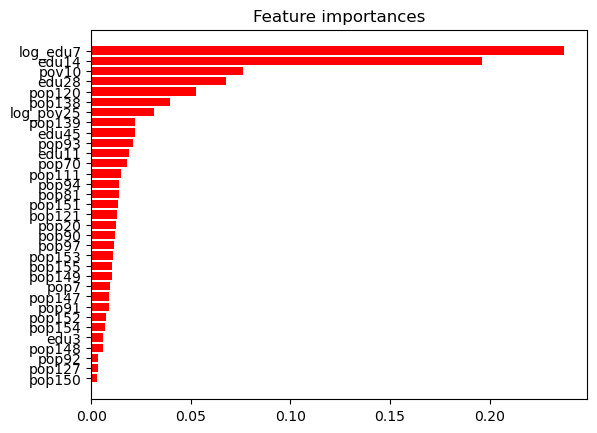

In [120]:
coef = model.feature_importances_
ind = np.argsort(-coef)
for i in range(X_tests.shape[1]):
    print("%d. %s (%f)" % (i + 1, Xs.columns[ind[i]], coef[ind[i]]))
x = range(X_tests.shape[1])
y = coef[ind][:Xs.shape[1]]
plt.title("Feature importances")
ax = plt.subplot()
plt.barh(x, y, color='red')
ax.set_yticks(x)
ax.set_yticklabels(Xs.columns[ind])
plt.gca().invert_yaxis()

In [121]:
### COMPARAISON DES RÉSULTATS 2008-2020, 2012-2020 et 2016-2020

In [122]:
compare.head()

,fips_code,county,total_2008,dem_2008,gop_2008,oth_2008,total_2012,dem_2012,gop_2012,oth_2012,total_2016,dem_2016,gop_2016,oth_2016
0,26041,Delta County,19064,9974,8763,327,18043,8330,9533,180,18467,6431,11112,924
1,48295,Lipscomb County,1256,155,1093,8,1168,119,1044,5,1322,135,1159,28
2,1127,Walker County,28652,7420,20722,510,28497,6551,21633,313,29243,4486,24208,549
3,48389,Reeves County,3077,1606,1445,26,2867,1649,1185,33,3184,1659,1417,108
4,56017,Hot Springs County,2546,619,1834,93,2495,523,1894,78,2535,400,1939,196


In [123]:
compare.shape

(3112, 14)

In [124]:
compare['victory_2016'] = np.where(compare['dem_2016'] > compare['gop_2016'], 'democratic_party','republican_party')
compare['victory_2012'] = np.where(compare['dem_2012'] > compare['gop_2012'], 'democratic_party','republican_party')
compare['victory_2008'] = np.where(compare['dem_2008'] > compare['gop_2008'], 'democratic_party','republican_party')
compare.head()

,fips_code,county,total_2008,dem_2008,gop_2008,oth_2008,total_2012,dem_2012,gop_2012,oth_2012,total_2016,dem_2016,gop_2016,oth_2016,victory_2016,victory_2012,victory_2008
0,26041,Delta County,19064,9974,8763,327,18043,8330,9533,180,18467,6431,11112,924,republican_party,republican_party,democratic_party
1,48295,Lipscomb County,1256,155,1093,8,1168,119,1044,5,1322,135,1159,28,republican_party,republican_party,republican_party
2,1127,Walker County,28652,7420,20722,510,28497,6551,21633,313,29243,4486,24208,549,republican_party,republican_party,republican_party
3,48389,Reeves County,3077,1606,1445,26,2867,1649,1185,33,3184,1659,1417,108,democratic_party,democratic_party,democratic_party
4,56017,Hot Springs County,2546,619,1834,93,2495,523,1894,78,2535,400,1939,196,republican_party,republican_party,republican_party


In [125]:
df_2008 = compare.copy()
df_2008

,fips_code,county,total_2008,dem_2008,gop_2008,oth_2008,total_2012,dem_2012,gop_2012,oth_2012,total_2016,dem_2016,gop_2016,oth_2016,victory_2016,victory_2012,victory_2008
0,26041,Delta County,19064,9974,8763,327,18043,8330,9533,180,18467,6431,11112,924,republican_party,republican_party,democratic_party
1,48295,Lipscomb County,1256,155,1093,8,1168,119,1044,5,1322,135,1159,28,republican_party,republican_party,republican_party
2,1127,Walker County,28652,7420,20722,510,28497,6551,21633,313,29243,4486,24208,549,republican_party,republican_party,republican_party
3,48389,Reeves County,3077,1606,1445,26,2867,1649,1185,33,3184,1659,1417,108,democratic_party,democratic_party,democratic_party
4,56017,Hot Springs County,2546,619,1834,93,2495,523,1894,78,2535,400,1939,196,republican_party,republican_party,republican_party
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,17115,Macon County,51216,25487,24948,781,48742,22688,25249,805,47283,18211,26782,2290,republican_party,republican_party,democratic_party
3108,29215,Texas County,10851,3410,7215,226,10764,2871,7618,275,10935,1728,8875,332,republican_party,republican_party,republican_party
3109,46051,Grant County,3830,1786,1951,93,3606,1493,2034,79,3562,970,2381,211,republican_party,republican_party,republican_party
3110,17103,Lee County,16318,7765,8258,295,15275,6932,8046,297,15215,5499,8597,1119,republican_party,republican_party,republican_party


In [126]:
df_2008 = df_2008[['county','victory_2008']]
df_2008

,county,victory_2008
0,Delta County,democratic_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party
...,...,...
3107,Macon County,democratic_party
3108,Texas County,republican_party
3109,Grant County,republican_party
3110,Lee County,republican_party


In [127]:
df_2008.rename(columns ={'county': 'county_name', 'victory_2008': 'victory'}, inplace = True)
df_2008

,county_name,victory
0,Delta County,democratic_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party
...,...,...
3107,Macon County,democratic_party
3108,Texas County,republican_party
3109,Grant County,republican_party
3110,Lee County,republican_party


In [128]:
df_2008['victory'].value_counts()

republican_party    2237
democratic_party     875
Name: victory, dtype: int64

In [129]:
df_2008['victory'] = df_2008['victory'].map({'republican_party': 1, 'democratic_party': 0}).astype(int)
df_2008

,county_name,victory
0,Delta County,0
1,Lipscomb County,1
2,Walker County,1
3,Reeves County,0
4,Hot Springs County,1
...,...,...
3107,Macon County,0
3108,Texas County,1
3109,Grant County,1
3110,Lee County,1


In [130]:
df_2012 = compare.copy()
df_2012.head()

,fips_code,county,total_2008,dem_2008,gop_2008,oth_2008,total_2012,dem_2012,gop_2012,oth_2012,total_2016,dem_2016,gop_2016,oth_2016,victory_2016,victory_2012,victory_2008
0,26041,Delta County,19064,9974,8763,327,18043,8330,9533,180,18467,6431,11112,924,republican_party,republican_party,democratic_party
1,48295,Lipscomb County,1256,155,1093,8,1168,119,1044,5,1322,135,1159,28,republican_party,republican_party,republican_party
2,1127,Walker County,28652,7420,20722,510,28497,6551,21633,313,29243,4486,24208,549,republican_party,republican_party,republican_party
3,48389,Reeves County,3077,1606,1445,26,2867,1649,1185,33,3184,1659,1417,108,democratic_party,democratic_party,democratic_party
4,56017,Hot Springs County,2546,619,1834,93,2495,523,1894,78,2535,400,1939,196,republican_party,republican_party,republican_party


In [131]:
df_2012 = df_2012[['county','victory_2012']]
df_2012

,county,victory_2012
0,Delta County,republican_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party
...,...,...
3107,Macon County,republican_party
3108,Texas County,republican_party
3109,Grant County,republican_party
3110,Lee County,republican_party


In [132]:
df_2012.rename(columns ={'county': 'county_name','victory_2012': 'victory'}, inplace = True)
df_2012

,county_name,victory
0,Delta County,republican_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party
...,...,...
3107,Macon County,republican_party
3108,Texas County,republican_party
3109,Grant County,republican_party
3110,Lee County,republican_party


In [133]:
df_2012['victory'].value_counts()

republican_party    2426
democratic_party     686
Name: victory, dtype: int64

In [134]:
df_2012['victory'] = df_2012['victory'].map({'republican_party': 1, 'democratic_party': 0}).astype(int)
df_2012

,county_name,victory
0,Delta County,1
1,Lipscomb County,1
2,Walker County,1
3,Reeves County,0
4,Hot Springs County,1
...,...,...
3107,Macon County,1
3108,Texas County,1
3109,Grant County,1
3110,Lee County,1


In [135]:
df_2016 = compare.copy()
df_2016.head()

,fips_code,county,total_2008,dem_2008,gop_2008,oth_2008,total_2012,dem_2012,gop_2012,oth_2012,total_2016,dem_2016,gop_2016,oth_2016,victory_2016,victory_2012,victory_2008
0,26041,Delta County,19064,9974,8763,327,18043,8330,9533,180,18467,6431,11112,924,republican_party,republican_party,democratic_party
1,48295,Lipscomb County,1256,155,1093,8,1168,119,1044,5,1322,135,1159,28,republican_party,republican_party,republican_party
2,1127,Walker County,28652,7420,20722,510,28497,6551,21633,313,29243,4486,24208,549,republican_party,republican_party,republican_party
3,48389,Reeves County,3077,1606,1445,26,2867,1649,1185,33,3184,1659,1417,108,democratic_party,democratic_party,democratic_party
4,56017,Hot Springs County,2546,619,1834,93,2495,523,1894,78,2535,400,1939,196,republican_party,republican_party,republican_party


In [136]:
df_2016 = df_2016[['county','victory_2016']]
df_2016.head()

,county,victory_2016
0,Delta County,republican_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party


In [137]:
df_2016.rename(columns ={'county': 'county_name','victory_2016': 'victory'}, inplace = True)
df_2016.head()

,county_name,victory
0,Delta County,republican_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party


In [138]:
df_2016.sort_index(inplace=True)
df_2016

,county_name,victory
0,Delta County,republican_party
1,Lipscomb County,republican_party
2,Walker County,republican_party
3,Reeves County,democratic_party
4,Hot Springs County,republican_party
...,...,...
3107,Macon County,republican_party
3108,Texas County,republican_party
3109,Grant County,republican_party
3110,Lee County,republican_party


In [139]:
df_2016['victory'].value_counts()

republican_party    2625
democratic_party     487
Name: victory, dtype: int64

In [140]:
df_2016['victory'] = df_2016['victory'].map({'republican_party': 1, 'democratic_party': 0}).astype(int)
df_2016

,county_name,victory
0,Delta County,1
1,Lipscomb County,1
2,Walker County,1
3,Reeves County,0
4,Hot Springs County,1
...,...,...
3107,Macon County,1
3108,Texas County,1
3109,Grant County,1
3110,Lee County,1


In [141]:
results.head()

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff,victory
0,Alabama,1001,Autauga County,19838,7503,27770,12335,0.71,0.27,0.44,republican_party
1,Alabama,1003,Baldwin County,83544,24578,109679,58966,0.76,0.22,0.54,republican_party
2,Alabama,1005,Barbour County,5622,4816,10518,806,0.53,0.46,0.08,republican_party
3,Alabama,1007,Bibb County,7525,1986,9595,5539,0.78,0.21,0.58,republican_party
4,Alabama,1009,Blount County,24711,2640,27588,22071,0.90,0.10,0.80,republican_party


In [142]:
df_2020 = results.copy()
df_2020

,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff,victory
0,Alabama,1001,Autauga County,19838,7503,27770,12335,0.71,0.27,0.44,republican_party
1,Alabama,1003,Baldwin County,83544,24578,109679,58966,0.76,0.22,0.54,republican_party
2,Alabama,1005,Barbour County,5622,4816,10518,806,0.53,0.46,0.08,republican_party
3,Alabama,1007,Bibb County,7525,1986,9595,5539,0.78,0.21,0.58,republican_party
4,Alabama,1009,Blount County,24711,2640,27588,22071,0.90,0.10,0.80,republican_party
...,...,...,...,...,...,...,...,...,...,...,...
3147,Wyoming,56037,Sweetwater County,12229,3823,16603,8406,0.74,0.23,0.51,republican_party
3148,Wyoming,56039,Teton County,4341,9848,14677,-5507,0.30,0.67,-0.38,democratic_party
3149,Wyoming,56041,Uinta County,7496,1591,9402,5905,0.80,0.17,0.63,republican_party
3150,Wyoming,56043,Washakie County,3245,651,4012,2594,0.81,0.16,0.65,republican_party


In [143]:
df_2020 = df_2020[['county_name','victory']]
df_2020.head()

,county_name,victory
0,Autauga County,republican_party
1,Baldwin County,republican_party
2,Barbour County,republican_party
3,Bibb County,republican_party
4,Blount County,republican_party


In [144]:
df_2020.sort_index(inplace=True)
df_2020

,county_name,victory
0,Autauga County,republican_party
1,Baldwin County,republican_party
2,Barbour County,republican_party
3,Bibb County,republican_party
4,Blount County,republican_party
...,...,...
3147,Sweetwater County,republican_party
3148,Teton County,democratic_party
3149,Uinta County,republican_party
3150,Washakie County,republican_party


In [145]:
df_2020['victory'] = df_2020['victory'].map({'republican_party': 1, 'democratic_party': 0}).astype(int)
df_2020

,county_name,victory
0,Autauga County,1
1,Baldwin County,1
2,Barbour County,1
3,Bibb County,1
4,Blount County,1
...,...,...
3147,Sweetwater County,1
3148,Teton County,0
3149,Uinta County,1
3150,Washakie County,1


In [146]:
df_2020.equals(df_2016)

False

In [147]:
df_2020.equals(df_2012)

False

In [148]:
df_2020.equals(df_2008)

False